In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
folder = "/content/gdrive/My Drive/"

!pip install biopython
!pip install cooler
!pip install cooltools

from IPython.display import clear_output
clear_output()
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

import os
import sys
import gc

sys.path.append(folder)
from .dataset import DataMaster
from .training import ModelMaster

In [ ]:
! wget http://makarich.fbb.msu.ru/agalicina/2021/yeast-worm/yeast/sacCer3.fa
! wget https://makarich.fbb.msu.ru/agalicina/2021/yeast-worm/yeast/A364.sacCer3.mapq_30.128.mcool
clear_output()

folder = "/content/gdrive/My Drive/"
genome = 'sacCer3.fa'
hic_name = 'A364.sacCer3.mapq_30.128.mcool::resolutions/128'

In [ ]:
data = DataMaster(
                 hic_file = hic_name, 
                 genome_file_or_dir = genome, 
                 fragment_length = 2**13,
                 sigma = 2,
                 chroms_to_exclude = ['chrIV'],
                 scale = (0,1),
                 map_size = 64,
                 nan_threshold = 0.2,
                 stochastic_sampling = False,
                 expand_dna = True,
                 shift_repeats = 4,
                 rev_comp = False,
                 dna_encoding = 'one-hot',
                 val_split = ('last', 64),
                 cut_chromosome_ends = 0,
                 sample_seed = 0)

DNA data for chrI is loaded
DNA data for chrII is loaded
DNA data for chrIII is loaded
DNA data for chrIX is loaded
DNA data for chrM is loaded
DNA data for chrV is loaded
DNA data for chrVI is loaded
DNA data for chrVII is loaded
DNA data for chrVIII is loaded
DNA data for chrX is loaded
DNA data for chrXI is loaded
DNA data for chrXII is loaded
DNA data for chrXIII is loaded
DNA data for chrXIV is loaded
DNA data for chrXV is loaded
DNA data for chrXVI is loaded

For 64x64 map used 4096 + 8192 + 4096 nucleotide fragments
Initial dataset contains 16384x16384 maps, overlooping in 64 pixels
128x128 maps for training will be sampled from them, maps for testing are their top left fragments
Hi-C data for chrI is loaded
Hi-C data for chrII is loaded
Hi-C data for chrIII is loaded
Hi-C data for chrIX is loaded
Hi-C data for chrM is loaded
Hi-C data for chrV is loaded
Hi-C data for chrVI is loaded
Hi-C data for chrVII is loaded
Hi-C data for chrVIII is loaded
Hi-C data for chrX is loaded
Hi-C

In [ ]:
Model = ModelMaster(data,
        saving_dir = 'saving_dir', 
        model_dir = None, 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])

No model files provided, build model parts manually using corresponding build_ methods


In [ ]:
latent_dim = 16
input_len = 2**14
def enc():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(input_shape=(64, 64, 1),
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(latent_dim, activation='linear')])
    return model

def dec():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(input_shape=(latent_dim, ), units=16*16*32, activation='relu'),
            tf.keras.layers.Reshape(target_shape=(16, 16, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same', activation = 'sigmoid')])
    return model

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias=False, activation='relu'))
    #model.add(tf.keras.layers.Dropout(0.15)) # new
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len)) - 6
    for block in range(pooling_range):
        model.add(tf.keras.layers.Dense(64, activation='relu'))
        #model.add(tf.keras.layers.Conv1D(64, 3, padding='same', use_bias=False, activation='relu')) #new
        model.add(tf.keras.layers.Dropout(0.11))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model


In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_1',
        rewrite=True,
        model_dir = None,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])
Model.build_enc(enc, folder+'Caccer_weights_enc.h5')
Model.build_dec(dec, folder+'Caccer_weights_dec.h5')
Model.build_model(model, folder+'Caccer_weights.h5')
Model.predict_as_training = False

No model files provided, build model parts manually using corresponding build_ methods
Hi-C maps successfully encoded


In [ ]:
Model.load_test_chromosome('chrIV')

DNA data for chrIV is loaded

For 64x64 map used 4096 + 8192 + 4096 nucleotide fragments
Initial dataset contains 16384x16384 maps, overlooping in 64 pixels
128x128 maps for training will be sampled from them, maps for testing are their top left fragments
Hi-C data for chrIV is loaded


5/5 [==============================] - 2s 342ms/step


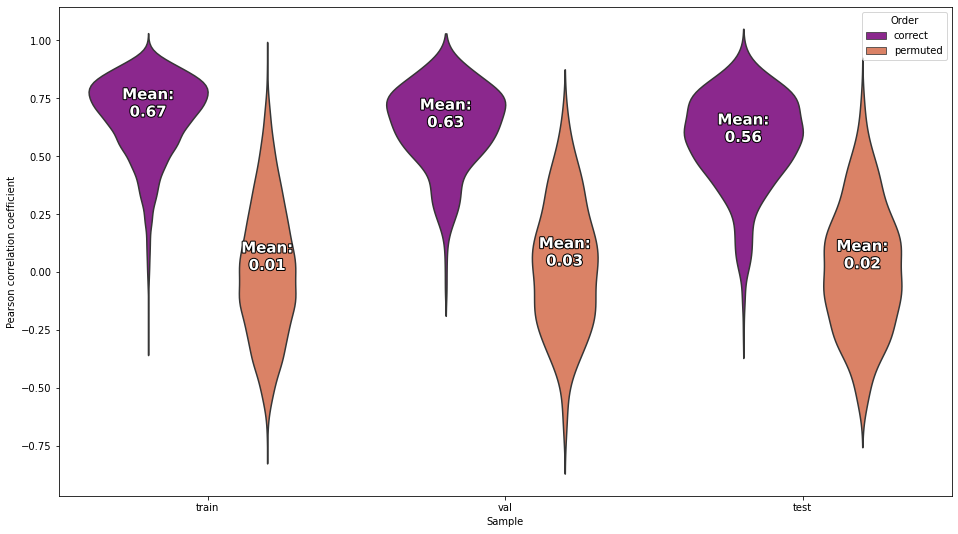

In [ ]:
Model.score()

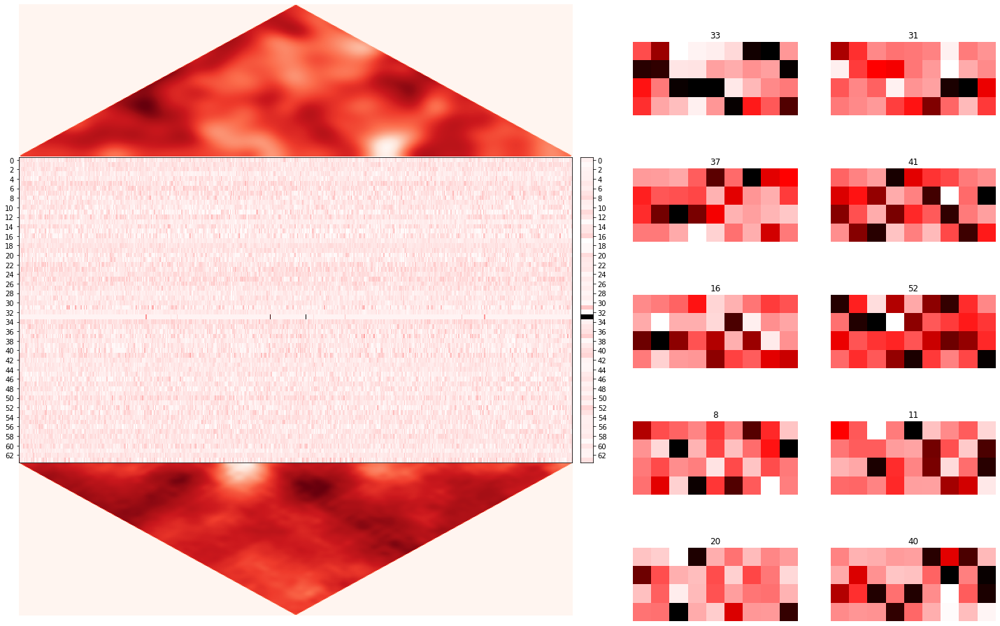

In [ ]:
f=Model.graphic_analisis(7, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=True)

In [ ]:
Model.train(10**6, batch_size=64, callbacks='classical')

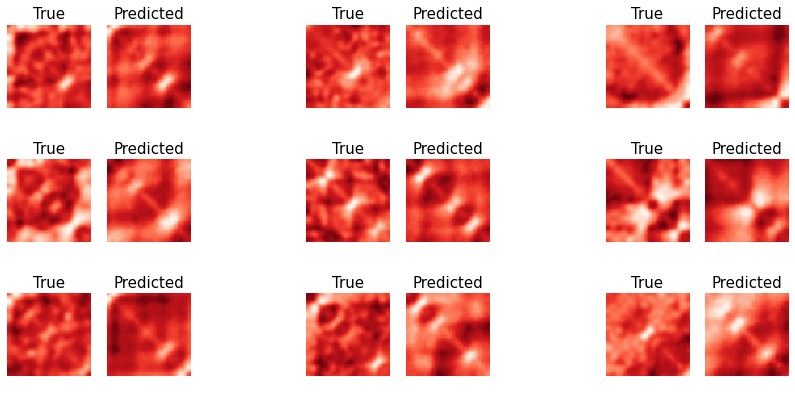

In [ ]:
Model.plot_results(['val', 10])

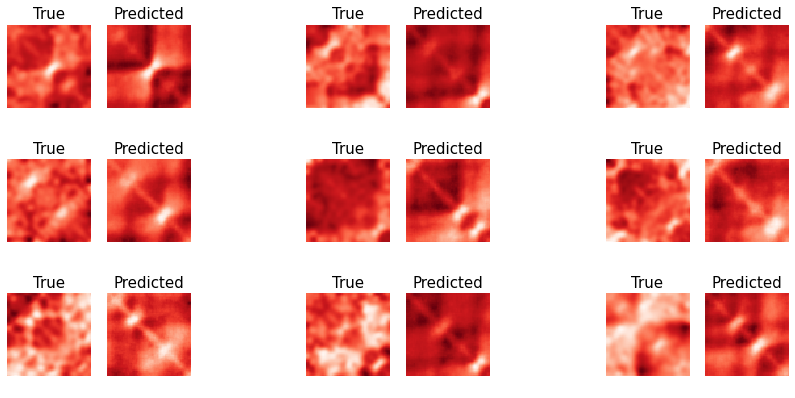

In [ ]:
Model.predict_as_training = False
Model.plot_results(['val', 20])

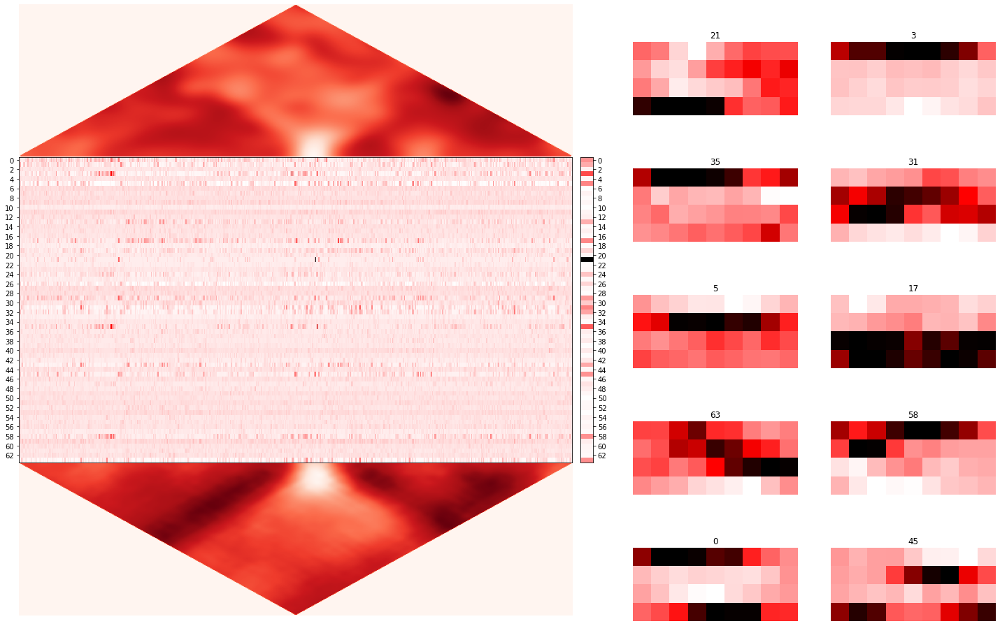

In [ ]:
Model.predict_as_training = False
filters = Model.graphic_analisis(20,
                                theme='light',
                                n_layers=3,
                                color_shifts={'heatmap': 200, 'filters': 200},
                                return_filters=True,
                                aggregation='mean')

In [ ]:
Model.model.save(folder+'Saccer_2.h5')
Model.enc.save(folder+'Saccer_2_enc.h5')
Model.dec.save(folder+'Saccer_2_dec.h5')


In [ ]:
Model.predict_as_training = False
Model.score()

Pearson correlation for training sample (random 128): 0.8632
Pearson correlation for validation sample (whole - 256): 0.5215
Pearson correlations for both samples where X and y are permuted:   0.0093, 0.0440

Test data contains chromosomes: chrIV
Pearson correlation for test sample (used 128 elements): 0.5373
Pearson correlation for test sample where X and y are permuted: -0.0139


In [ ]:
Model.plot_filters()

In [ ]:
o = filters[3]
np.set_printoptions(linewidth=200, precision=4)
e = o - o.min()
w = np.sort(e.flatten())[:2]
y = (e/w[1])
print(str(y**3).replace('[','').replace(']', ''))

 4.1981 18.4617  3.5311  8.8015 10.4456 10.2594 11.3092  5.8915  7.9603
 16.8868  2.4161  7.297  13.3992  1.      7.1092  5.8465  3.9787 12.1932
  6.8915  7.4148 20.7489  0.      9.1765 22.2481  1.6258  8.8336 17.9408
  9.3111  8.3602  8.4963 15.8899 16.1427  1.8494 15.1527 19.7697  4.7996


In [ ]:
 3.4806  4.4472  6.4544  2.8014  3.6087  0.      2.0889  8.1218  7.8111
 7.5223  3.1118  4.933  12.3355  3.0675  2.5262  6.7889  3.1361  6.7761
 8.8273  9.9977  2.1021  3.6522  1.      8.0612 10.6035  2.8381  3.1575
 1.1278  3.9256  7.0141  3.5341 10.8666  5.6521  2.3351  5.5649  5.7109

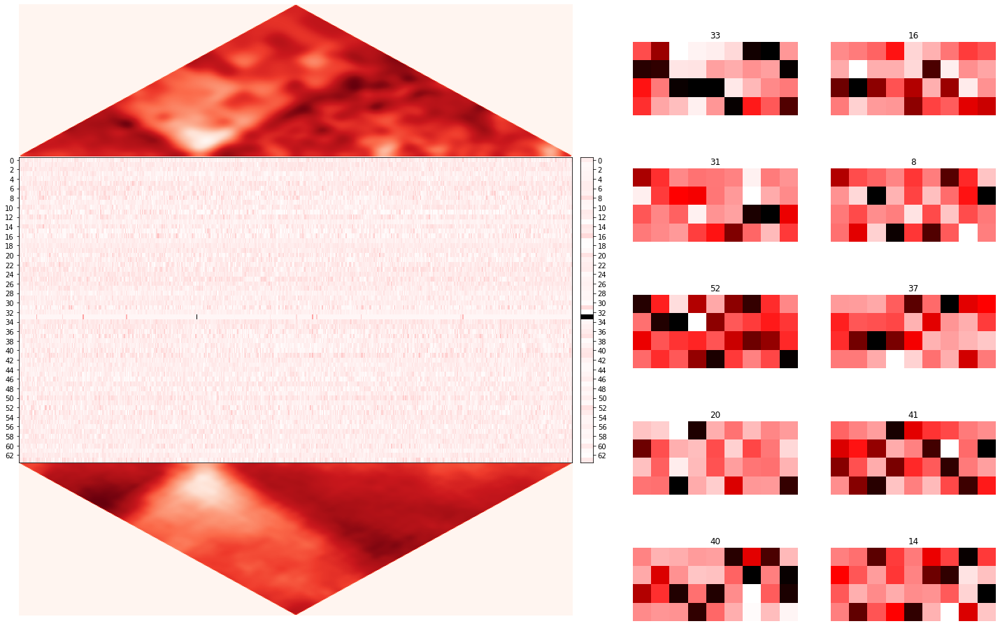

In [ ]:
filters = Model.graphic_analisis(7,
                                theme='light',
                                n_layers=3,
                                color_shifts={'heatmap': 200, 'filters': 200},
                                return_filters=True,
                                aggregation='max')

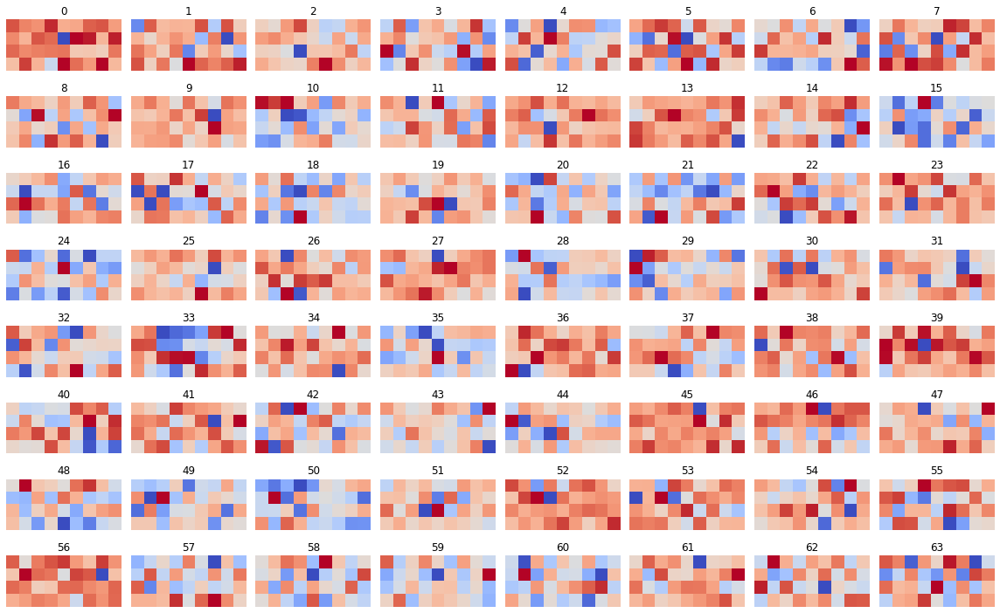

In [ ]:
Model.plot_filters()

In [ ]:
Model.load_test_chromosome('chrIV')

In [ ]:
Model.score()

Pearson correlation for training sample (random 128): 0.6029
Pearson correlation for validation sample (whole - 32): 0.5441
Pearson correlations for both samples where X and y are permuted:   -0.0125, 0.0553

Test data contains chromosomes: chrIV
Pearson correlation for test sample (used 128 elements): 0.5066
Pearson correlation for test sample where X and y are permuted: -0.0059


In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_3', 
        model_dir = None,
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])


latent_dim = 16
input_len = 2**14
def enc():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(input_shape=(64, 64, 1),
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(latent_dim, activation='linear')])
    return model

def dec():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(input_shape=(latent_dim, ), units=16*16*32, activation='relu'),
            tf.keras.layers.Reshape(target_shape=(16, 16, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same', activation = 'sigmoid')])
    return model

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.15)) # new
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len)) - 8 # -6
    for block in range(pooling_range):
        #model.add(tf.keras.layers.Dense(64, activation='relu'))
        model.add(tf.keras.layers.Conv1D(64, 3, padding='same', activation='relu')) #new
        model.add(tf.keras.layers.Dropout(0.15)) #0.1
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

Model.build_enc(enc)
Model.build_dec(dec)
Model.build_model(model)
clear_output()
Model.train(2000, batch_size=64, callbacks='classical')

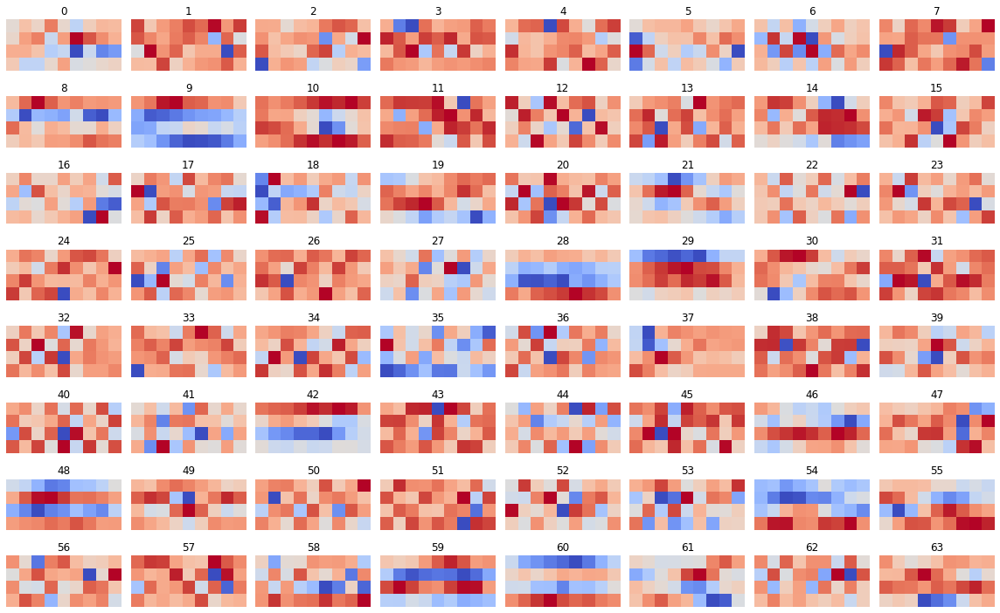

In [ ]:
Model.plot_filters()

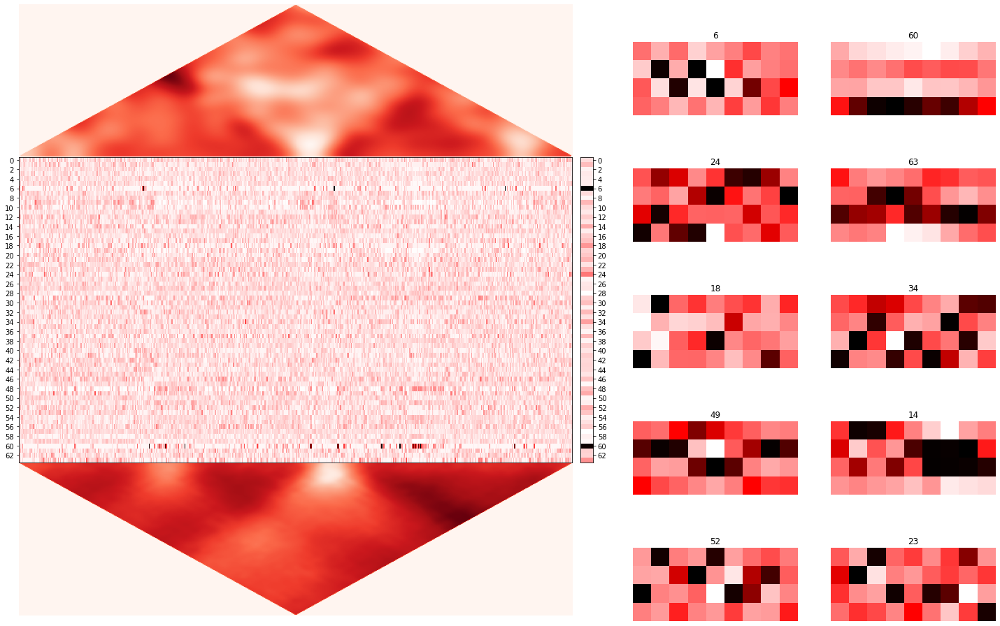

In [ ]:
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)

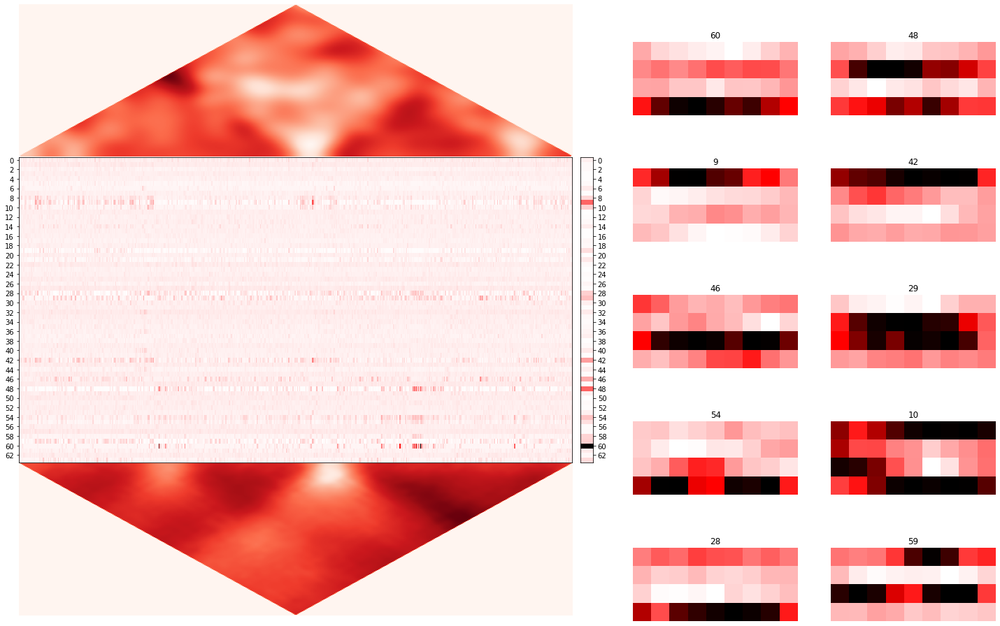

In [ ]:
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)

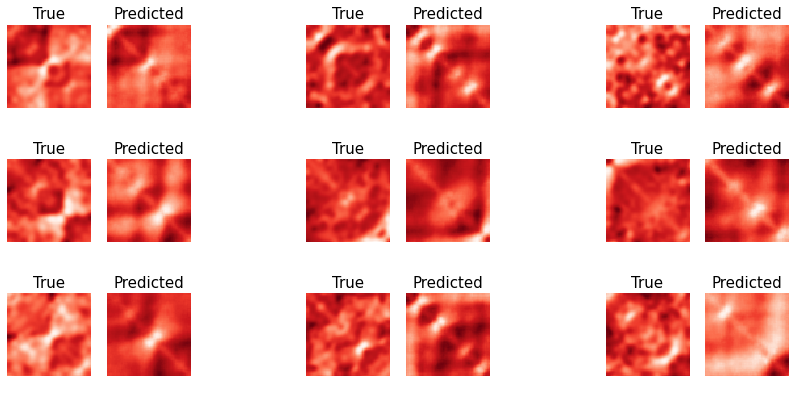

In [ ]:
Model.plot_results(['val', 0])

In [ ]:
Model.score()

Pearson correlation for training sample (random 128): 0.7264
Pearson correlation for validation sample (whole - 256): 0.4574
Pearson correlations for both samples where X and y are permuted:   -0.0016, 0.0234


In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_4', 
        model_dir = None, 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])


latent_dim = 16
input_len = 2**14
def enc():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(input_shape=(64, 64, 1),
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(latent_dim, activation='linear')])
    return model

def dec():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(input_shape=(latent_dim, ), units=16*16*32, activation='relu'),
            tf.keras.layers.Reshape(target_shape=(16, 16, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same', activation = 'sigmoid')])
    return model

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.15)) # new
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len)) - 8 # -6
    for block in range(pooling_range):
        model.add(tf.keras.layers.Dense(64, activation='relu'))
        #model.add(tf.keras.layers.Conv1D(64, 5, padding='same', activation='relu')) #new
        model.add(tf.keras.layers.Dropout(0.15)) #0.1
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

Model.build_enc(enc)
Model.build_dec(dec)
Model.build_model(model)
clear_output()
Model.train(2000, batch_size=64, callbacks='classical')

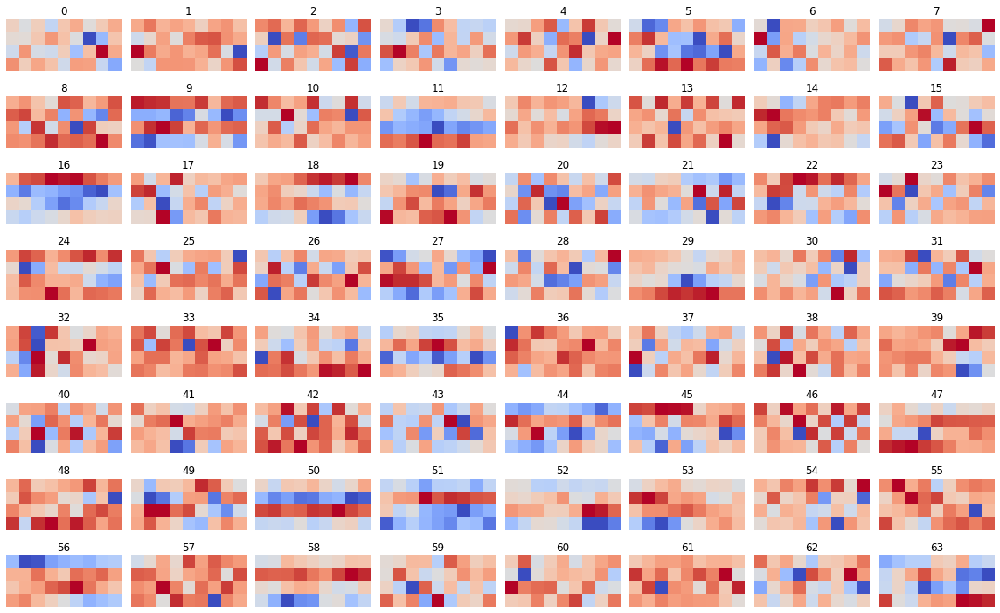

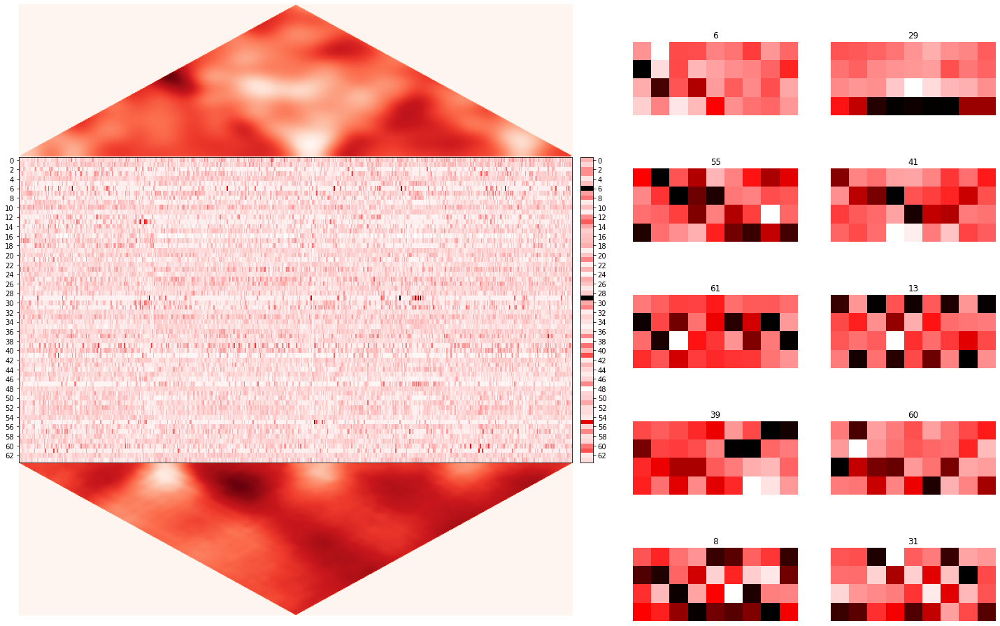

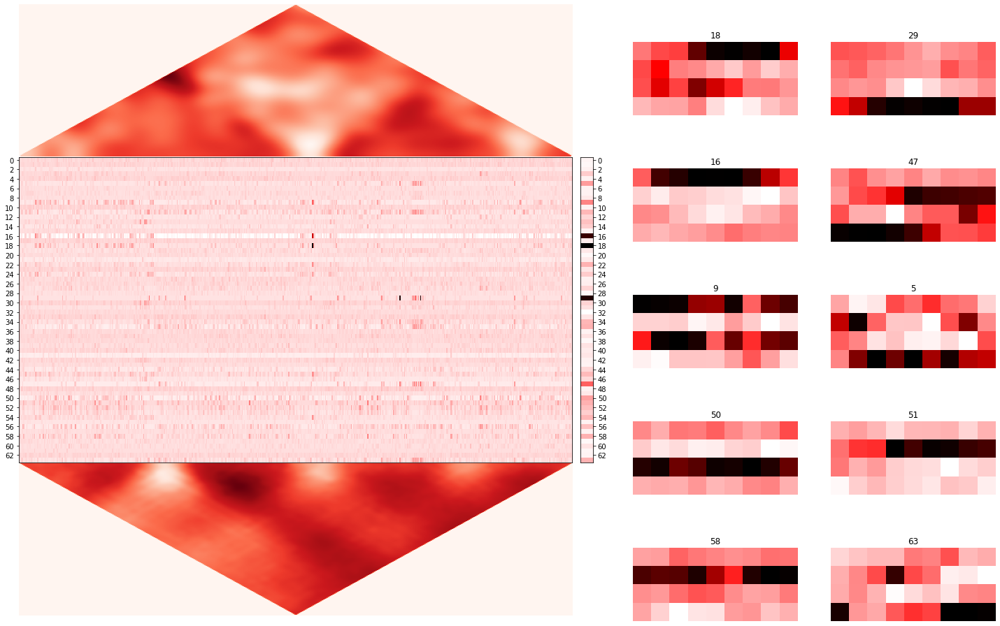

Pearson correlation for training sample (random 128): 0.6670
Pearson correlation for validation sample (whole - 256): 0.3663
Pearson correlations for both samples where X and y are permuted:   0.0013, 0.0046


In [ ]:
Model.plot_filters()
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.score()

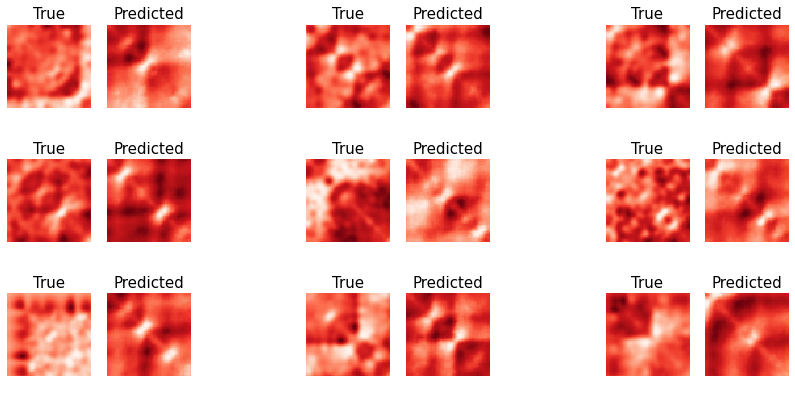

In [ ]:
Model.plot_results()

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_5', 
        model_dir = None, 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])


latent_dim = 16
input_len = 2**14
def enc():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(input_shape=(64, 64, 1),
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(latent_dim, activation='linear')])
    return model

def dec():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(input_shape=(latent_dim, ), units=16*16*32, activation='relu'),
            tf.keras.layers.Reshape(target_shape=(16, 16, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same', activation = 'sigmoid')])
    return model

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len))-6
    for block in range(pooling_range):
        model.add(tf.keras.layers.Dense(64, activation='relu'))
        #model.add(tf.keras.layers.Conv1D(64, 5, padding='same', activation='relu')) #new
        model.add(tf.keras.layers.Dropout(0.15)) #0.1
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

Model.build_enc(enc)
Model.build_dec(dec)
Model.build_model(model)
clear_output()
Model.train(2000, batch_size=64, callbacks='classical')

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 16384, 64)         2304      
_________________________________________________________________
batch_normalization (BatchNo (None, 16384, 64)         256       
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 8192, 64)          0         
_________________________________________________________________
dense_2 (Dense)              (None, 8192, 64)          4160      
_________________________________________________________________
dropout (Dropout)            (None, 8192, 64)          0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 8192, 64)          256       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 4096, 64)         

KeyboardInterrupt: ignored

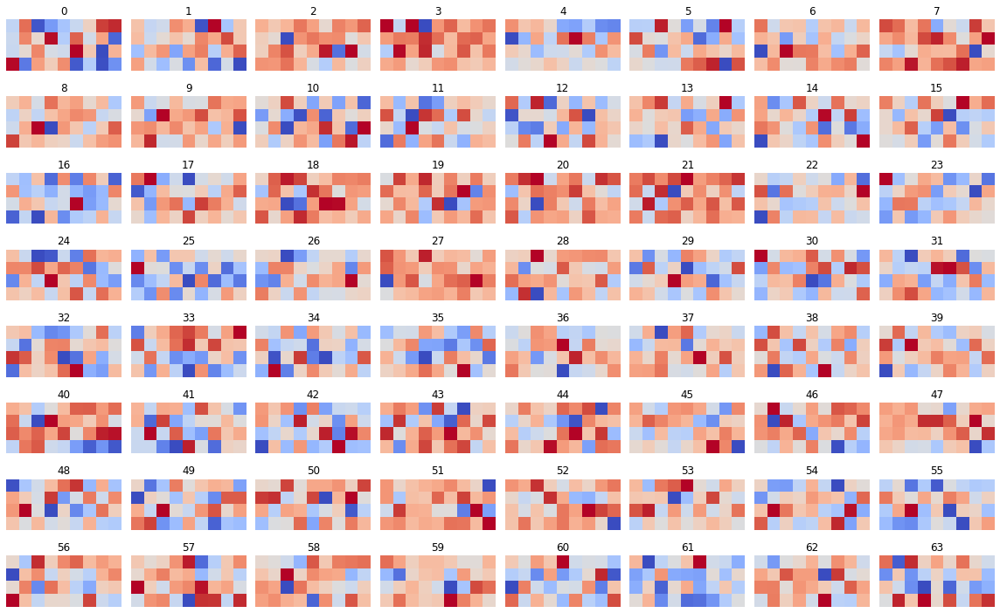

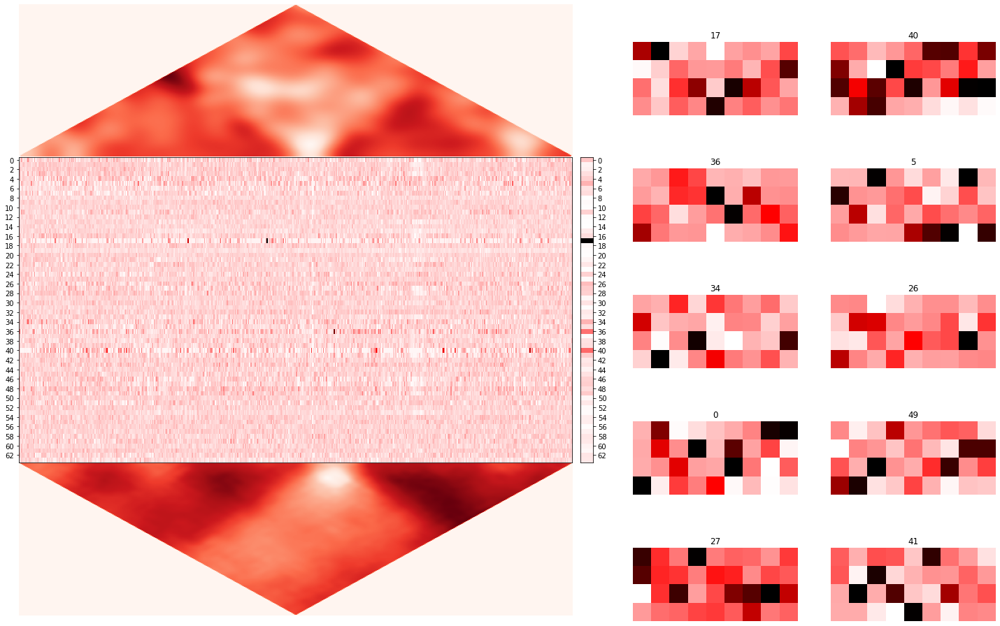

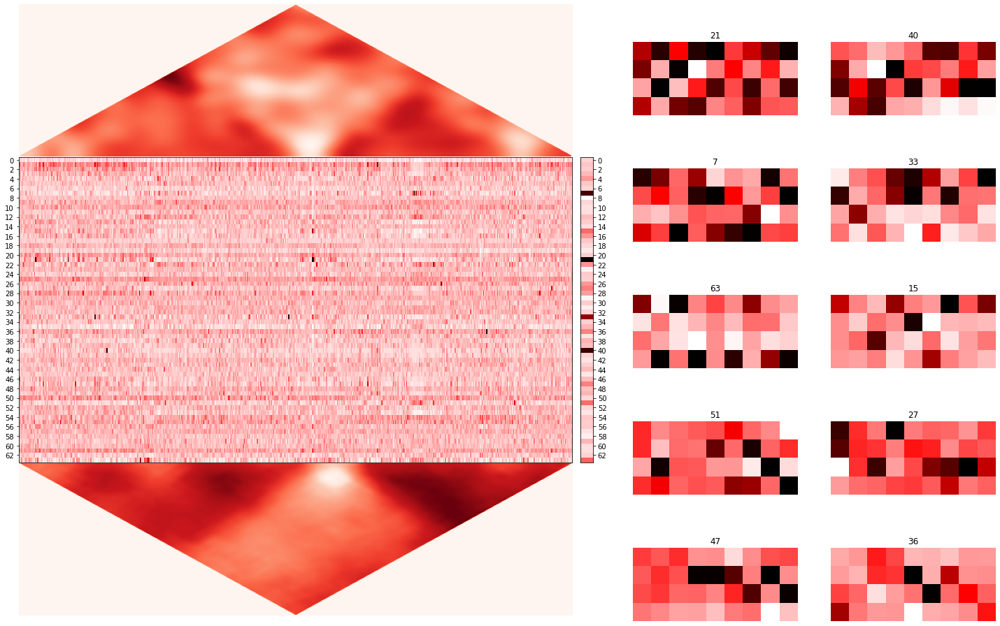

Pearson correlation for training sample (random 128): 0.8409
Pearson correlation for validation sample (whole - 256): 0.5425
Pearson correlations for both samples where X and y are permuted:   0.0375, -0.0409


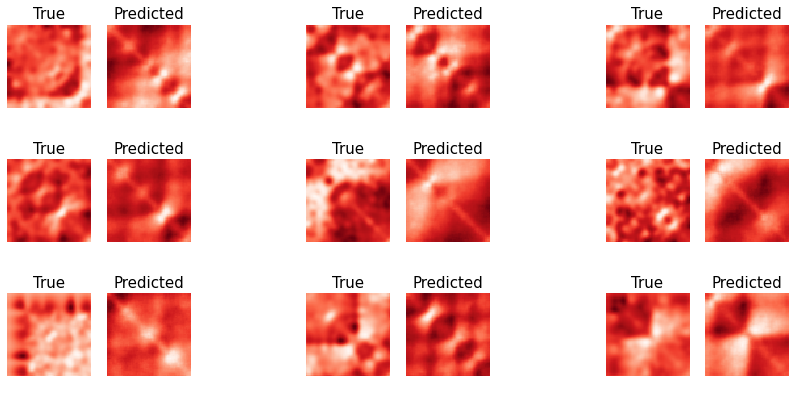

In [ ]:
Model.plot_filters()
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.score()
Model.plot_results()

In [ ]:
Model.predict_as_training = False
Model.score()

Pearson correlation for training sample (random 128): 0.8401
Pearson correlation for validation sample (whole - 256): 0.5425
Pearson correlations for both samples where X and y are permuted:   0.0268, 0.0027


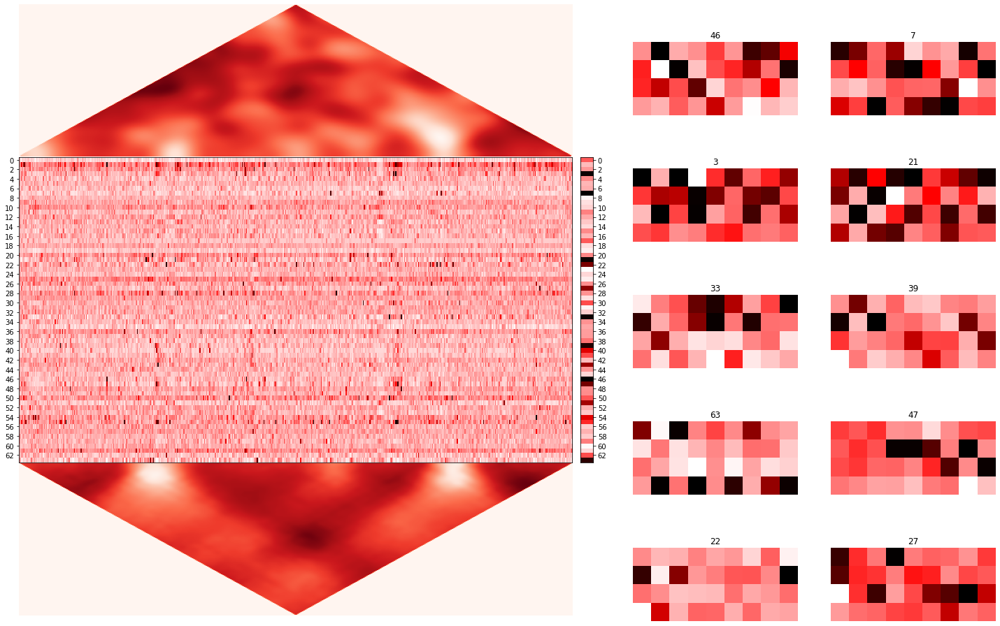

In [ ]:
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_6', 
        model_dir = folder+'Saccer_5', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])


latent_dim = 16
input_len = 2**14

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len))-6
    for block in range(1):
        model.add(tf.keras.layers.Dense(64, activation='relu'))
        #model.add(tf.keras.layers.Conv1D(64, 5, padding='same', activation='relu')) #new
        model.add(tf.keras.layers.Dropout(0.15)) #0.1
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=128))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

#Model.build_enc(enc)
#Model.build_dec(dec)
Model.build_model(model)
clear_output()
Model.train(2000, batch_size=64, callbacks='classical')

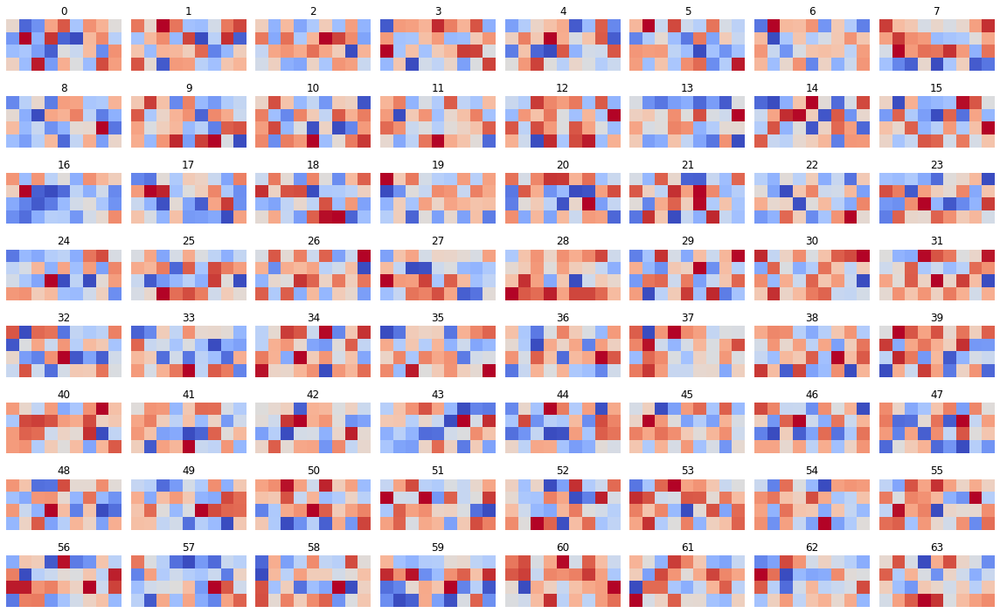

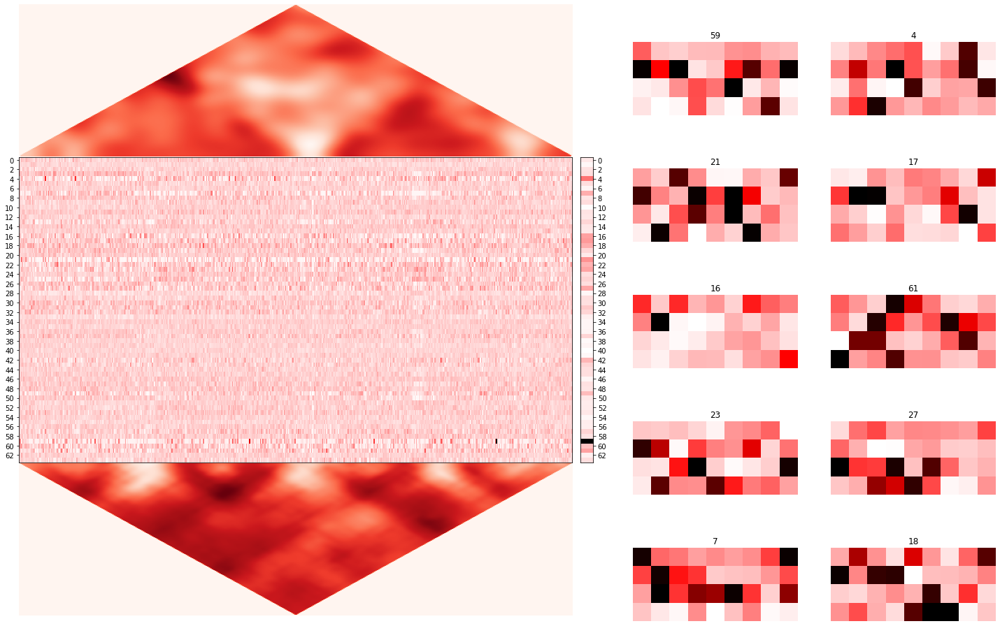

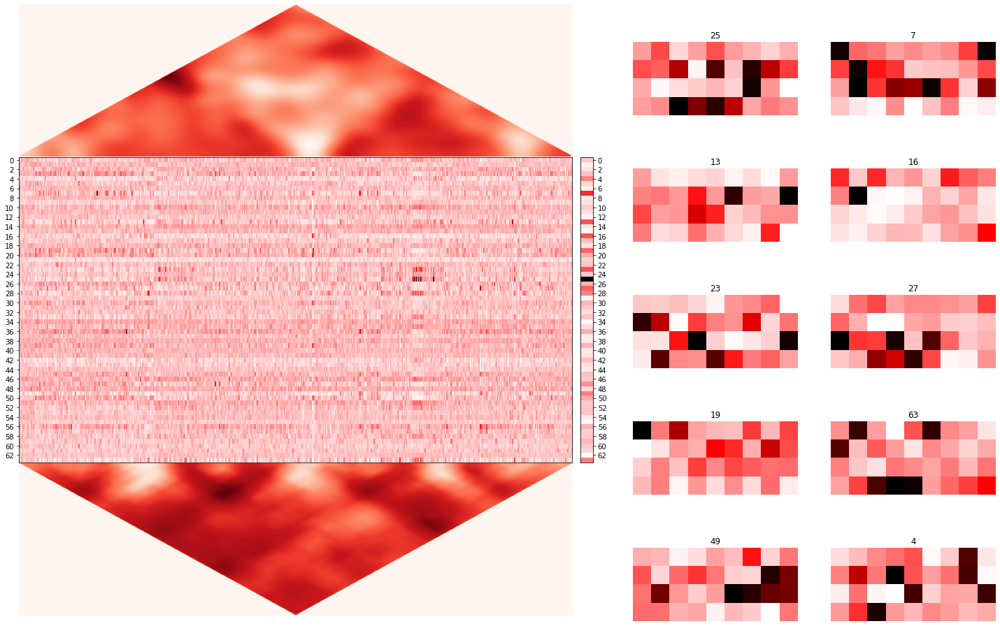

Pearson correlation for training sample (random 128): 0.6695
Pearson correlation for validation sample (whole - 256): 0.2752
Pearson correlations for both samples where X and y are permuted:   0.0366, 0.0027


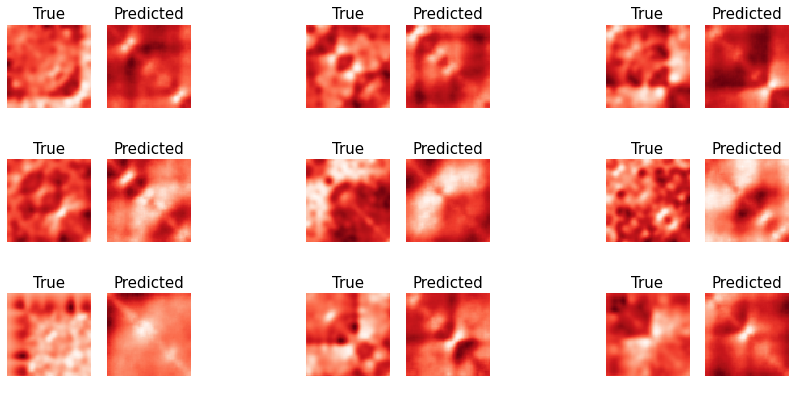

In [ ]:
Model.plot_filters()
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.score()
Model.plot_results()

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_7', 
        model_dir = folder+'Saccer_5', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])


latent_dim = 16
input_len = 2**14

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len))-8
    for block in range(pooling_range):
        model.add(tf.keras.layers.Dense(64, activation='relu'))
        #model.add(tf.keras.layers.Conv1D(64, 5, padding='same', activation='relu')) #new
        model.add(tf.keras.layers.Dropout(0.15)) #0.1
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

#Model.build_enc(enc)
#Model.build_dec(dec)
Model.build_model(model)
clear_output()
Model.train(2000, batch_size=64, callbacks='classical')

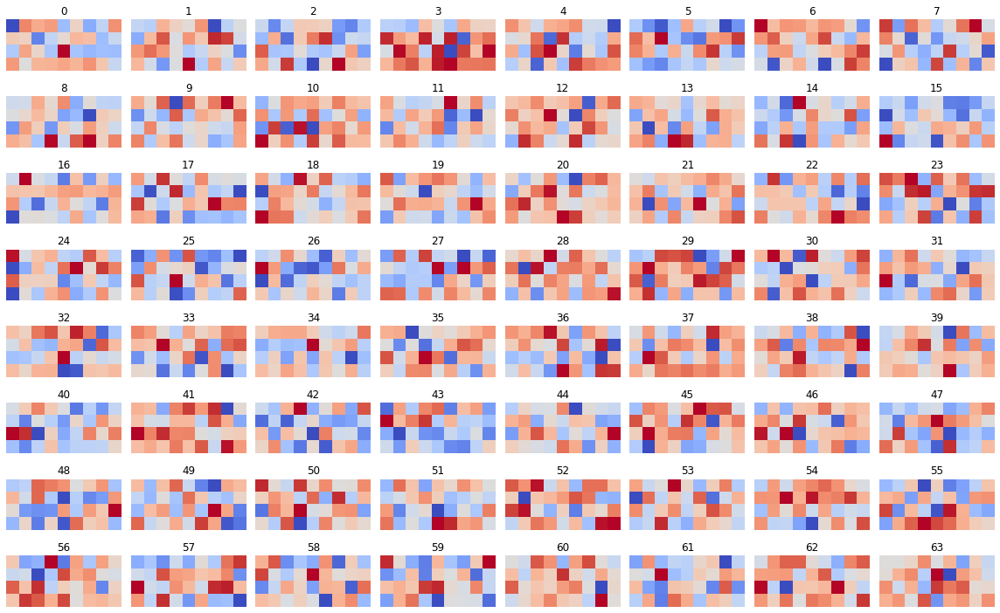

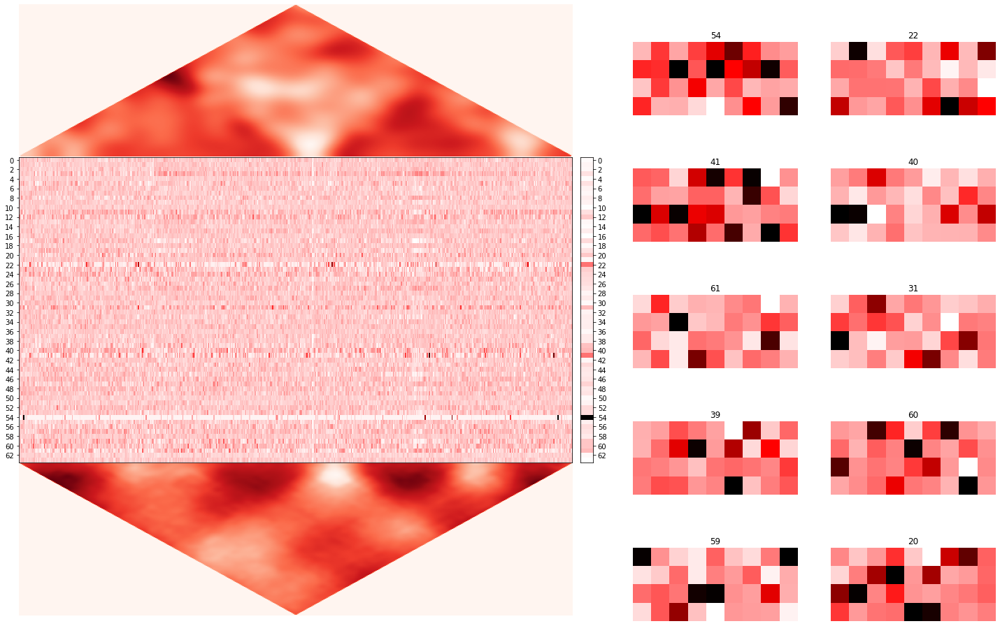

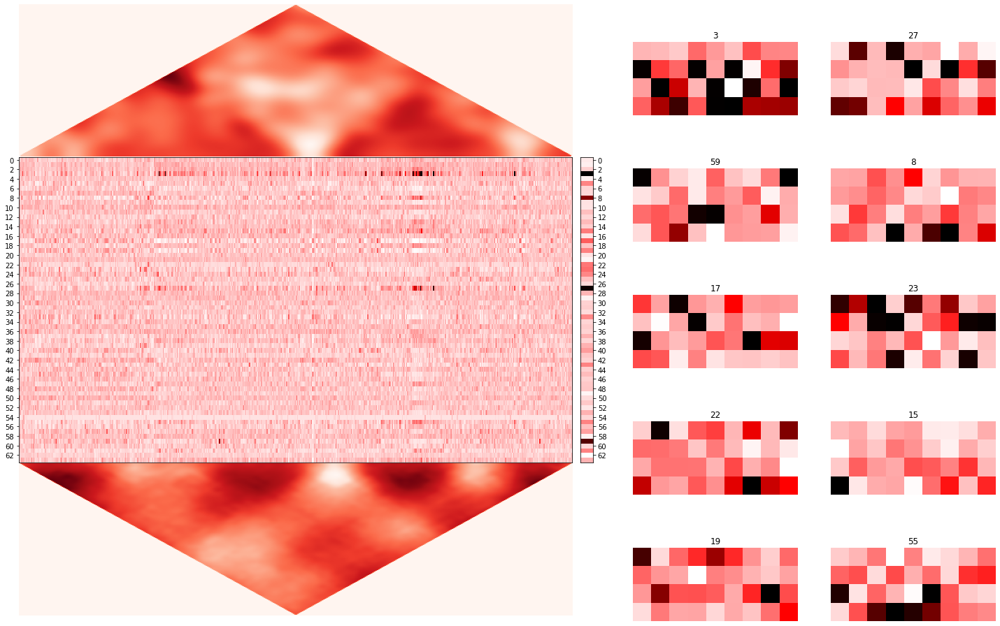

Pearson correlation for training sample (random 128): 0.6651
Pearson correlation for validation sample (whole - 256): 0.3638
Pearson correlations for both samples where X and y are permuted:   0.0055, 0.0316


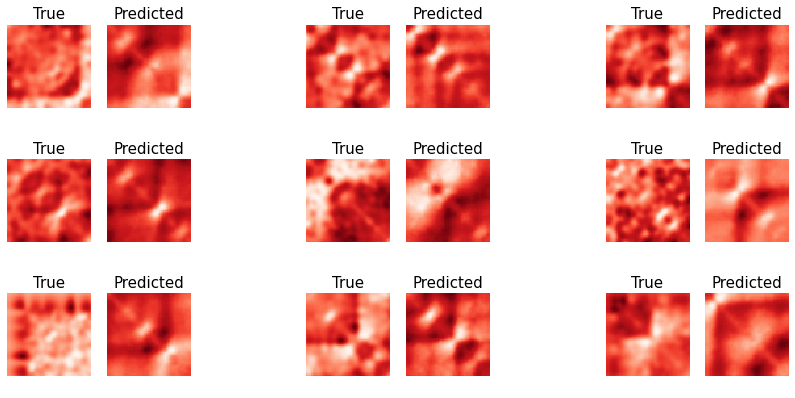

In [ ]:
Model.plot_filters()
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(6, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.score()
Model.plot_results()

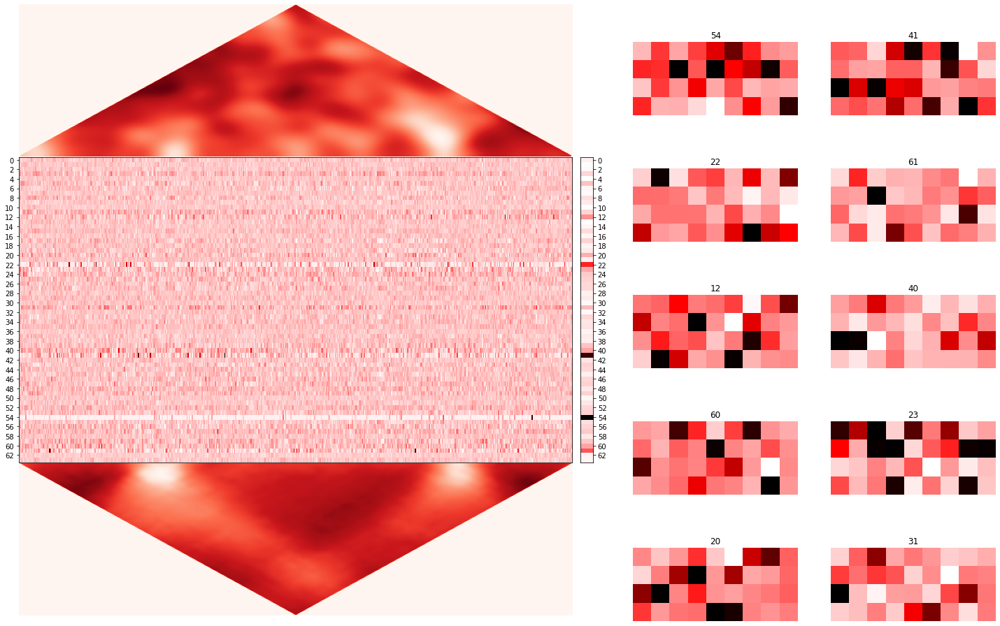

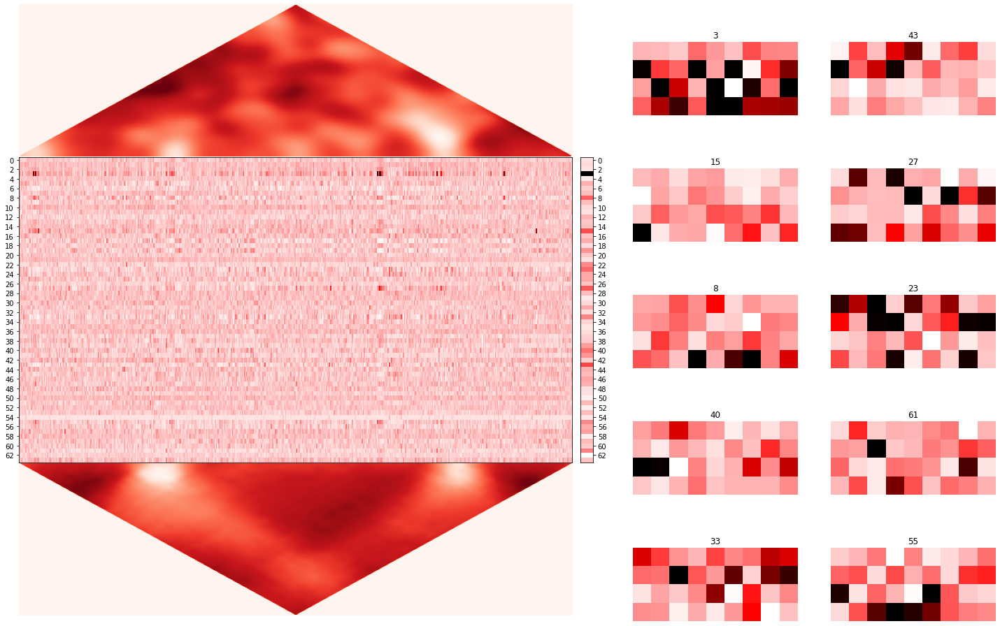

In [ ]:
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_8', 
        model_dir = folder+'Saccer_5', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])


latent_dim = 16
input_len = 2**14

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False, activation='relu'))
    #model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len))-8
    for block in range(pooling_range):
        #model.add(tf.keras.layers.Dense(64, activation='relu'))
        model.add(tf.keras.layers.Conv1D(64, 5, padding='same', activation='relu')) #new
        model.add(tf.keras.layers.Dropout(0.15)) #0.1
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

#Model.build_enc(enc)
#Model.build_dec(dec)
Model.build_model(model)
clear_output()
Model.train(500, batch_size=64, callbacks='classical')

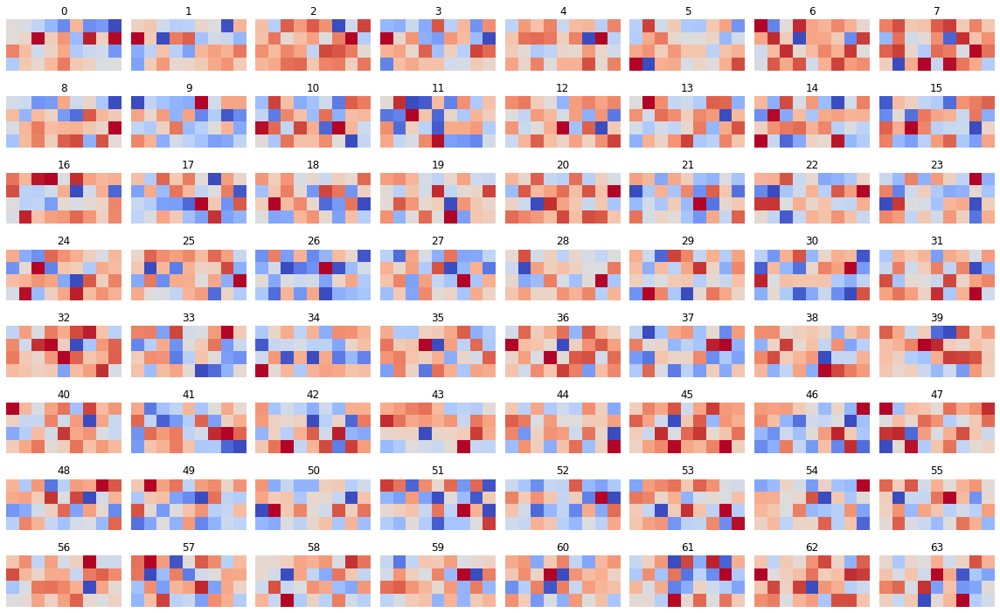

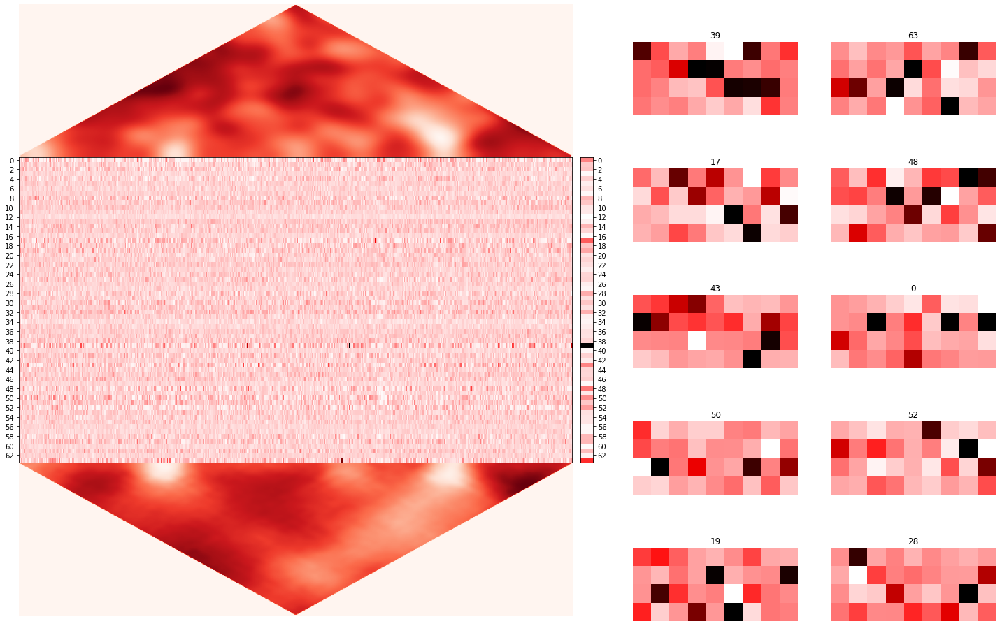

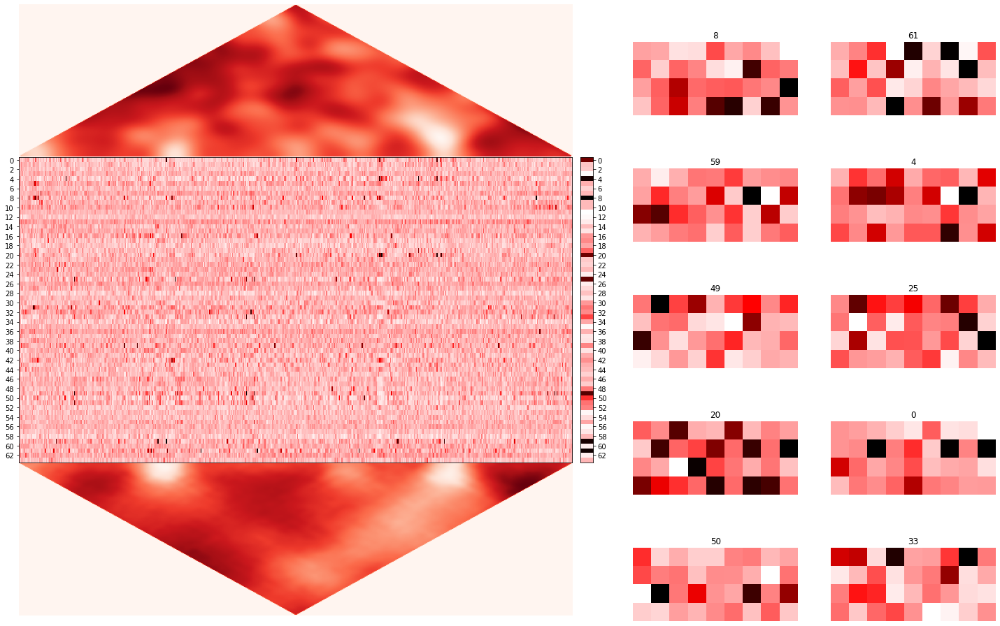

Pearson correlation for training sample (random 128): 0.7550
Pearson correlation for validation sample (whole - 256): 0.4882
Pearson correlations for both samples where X and y are permuted:   0.0365, 0.0099


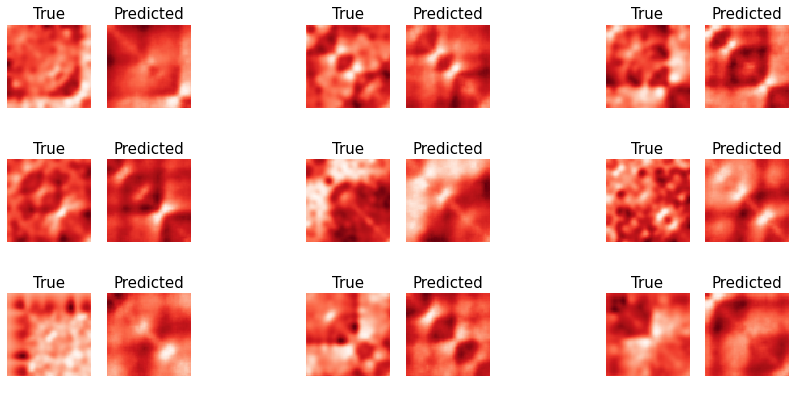

In [ ]:
Model.plot_filters()
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.score()
Model.plot_results()

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_9', 
        model_dir = folder+'Saccer_5', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])


latent_dim = 16
input_len = 2**14

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len))-8
    for block in range(pooling_range):
        #model.add(tf.keras.layers.Dense(64, activation='relu'))
        model.add(tf.keras.layers.Conv1D(64, 5, padding='same', activation='relu')) #new
        model.add(tf.keras.layers.Dropout(0.15)) #0.1
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

#Model.build_enc(enc)
#Model.build_dec(dec)
Model.build_model(model)
clear_output()
Model.train(500, batch_size=64, callbacks='classical')

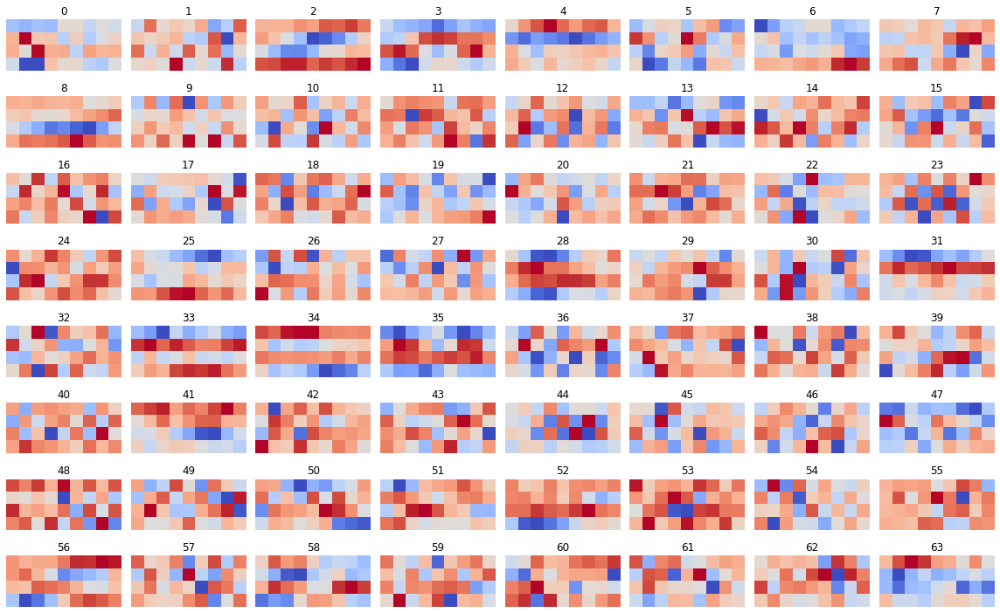

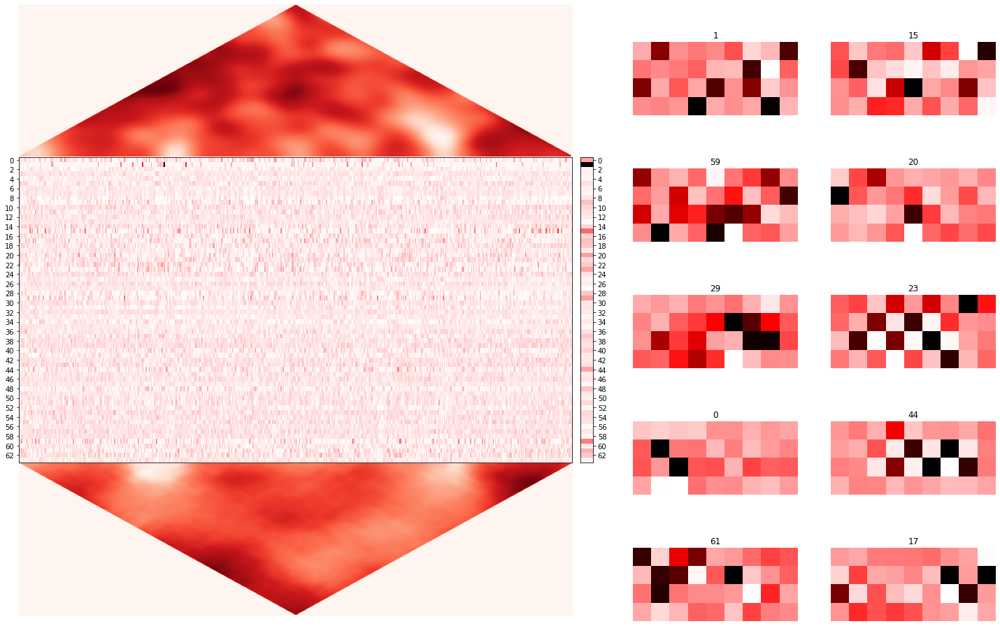

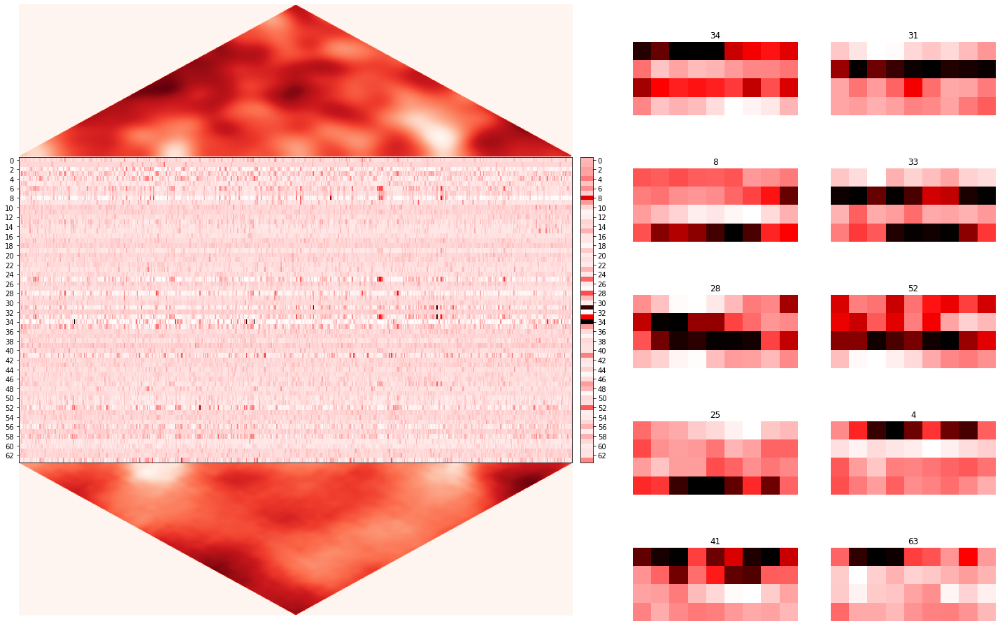

Pearson correlation for training sample (random 128): 0.7227
Pearson correlation for validation sample (whole - 256): 0.4821
Pearson correlations for both samples where X and y are permuted:   0.0035, 0.0158


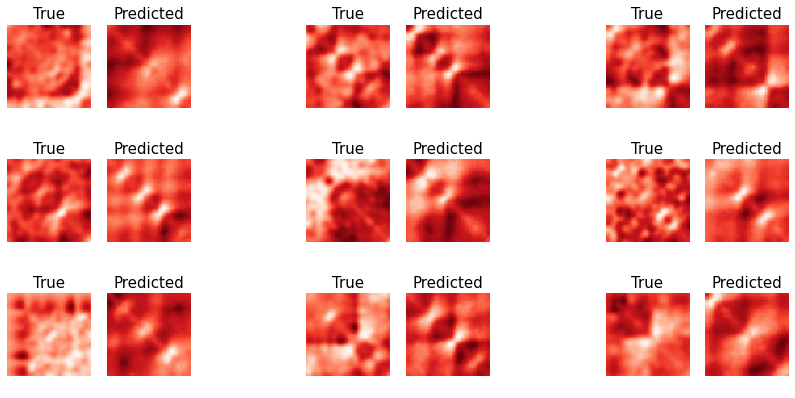

In [ ]:
Model.plot_filters()
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.score()
Model.plot_results()

In [ ]:
Model.predict_as_training = False
Model.score()

Pearson correlation for training sample (random 128): 0.8564
Pearson correlation for validation sample (whole - 256): 0.5294
Pearson correlations for both samples where X and y are permuted:   -0.0017, -0.0076


In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_10', 
        model_dir = folder+'Saccer_5', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])


latent_dim = 16
input_len = 2**14

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    model.add(tf.keras.layers.Dropout(0.15))


    pooling_range = int(np.log2(input_len))-8
    for block in range(pooling_range):
        #model.add(tf.keras.layers.Dense(64, activation='relu'))
        model.add(tf.keras.layers.Conv1D(64, 5, padding='same', activation='relu')) #new
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
        model.add(tf.keras.layers.Dropout(0.15)) #0.1
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

#Model.build_enc(enc)
#Model.build_dec(dec)
Model.build_model(model)
clear_output()
Model.train(1500, batch_size=64, callbacks='classical')

Model.plot_filters()
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.score()
Model.plot_results()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 16384, 64)         2304      
_________________________________________________________________
batch_normalization (BatchNo (None, 16384, 64)         256       
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 8192, 64)          0         
_________________________________________________________________
dropout (Dropout)            (None, 8192, 64)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 8192, 64)          20544     
_________________________________________________________________
batch_normalization_1 (Batch (None, 8192, 64)          256       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 4096, 64)          0

KeyboardInterrupt: ignored

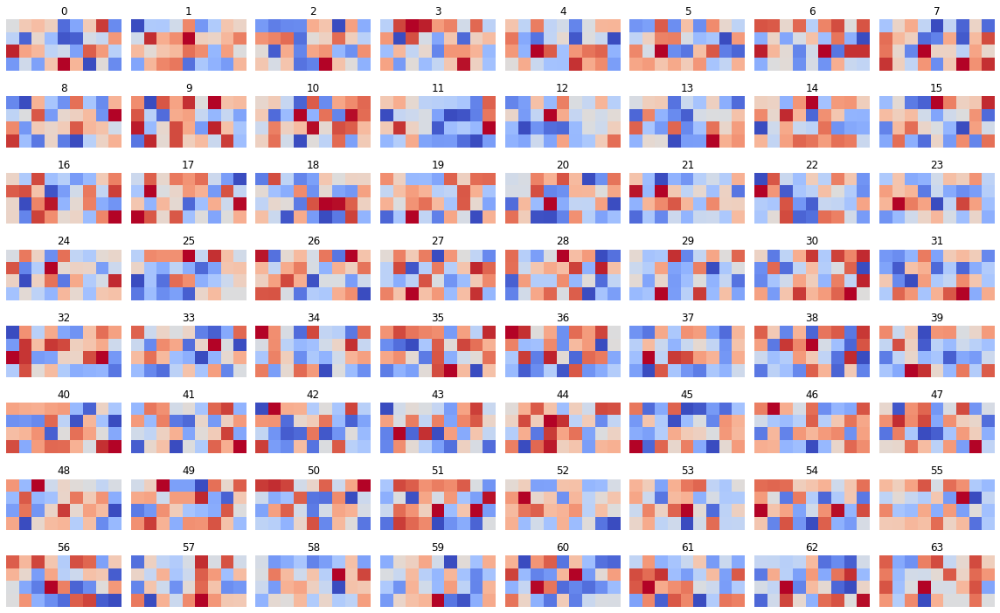

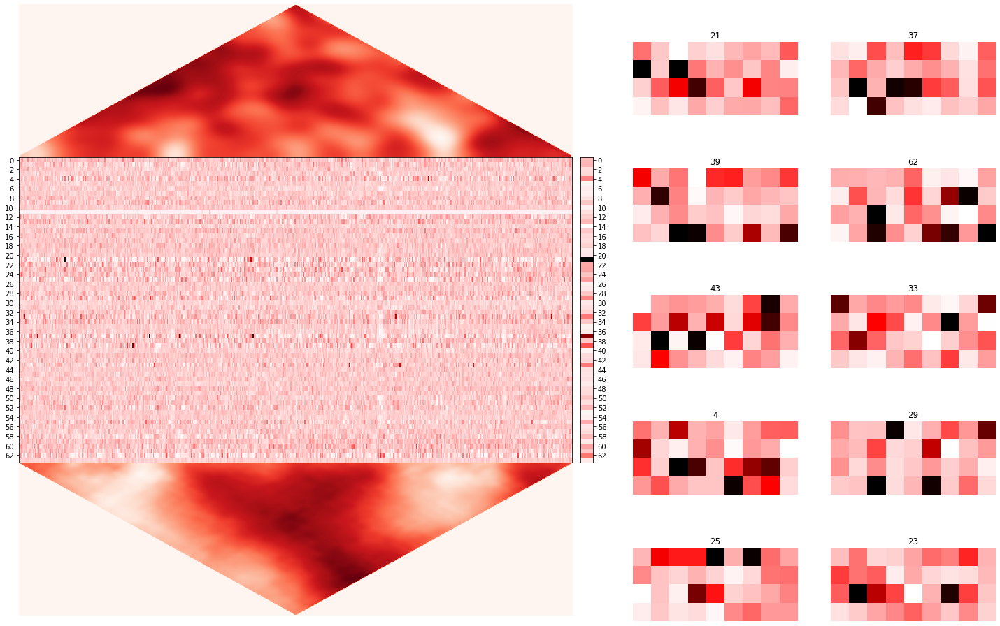

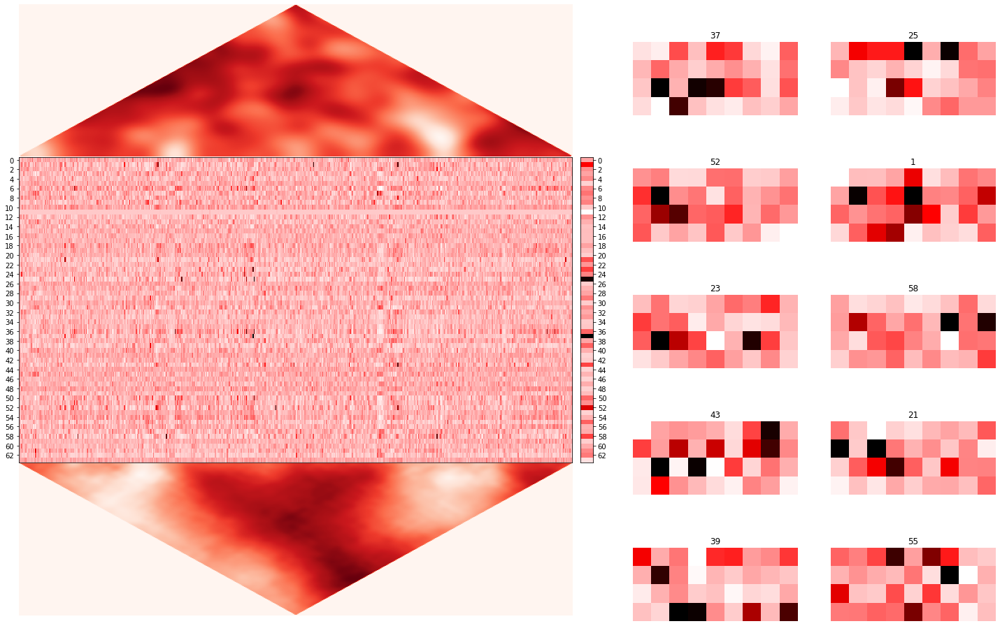

Pearson correlation for training sample (random 128): 0.5556
Pearson correlation for validation sample (whole - 256): 0.2964
Pearson correlations for both samples where X and y are permuted:   0.0304, -0.0187


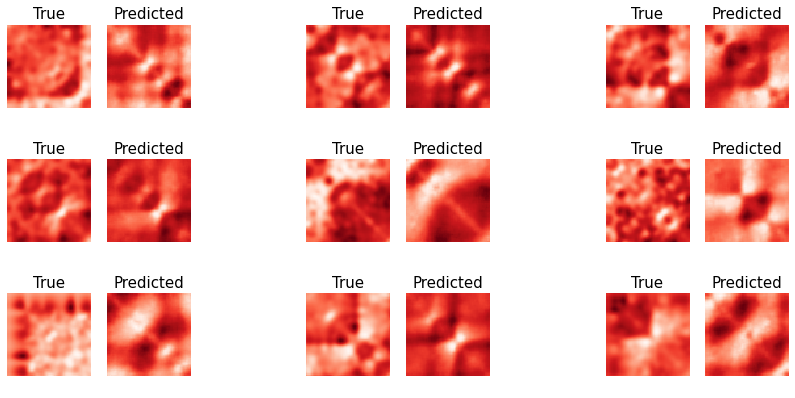

In [ ]:
Model.plot_filters()
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.score()
Model.plot_results()

In [ ]:

Model = ModelMaster(data,
        saving_dir = folder+'Saccer_11', 
        model_dir = folder+'Saccer_5', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])


latent_dim = 16
input_len = 2**14

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len))-9
    for block in range(pooling_range):
        #model.add(tf.keras.layers.Dense(64, activation='relu'))
        model.add(tf.keras.layers.Conv1D(64, 5, padding='same', activation='relu')) #new
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

#Model.build_enc(enc)
#Model.build_dec(dec)
Model.build_model(model)
clear_output()
Model.train(1500, batch_size=64, callbacks='classical')

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_11', 
        model_dir = folder+'Saccer_11', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])



In [ ]:
Model.train(1500000, batch_size=64, callbacks='classical')


Model.plot_filters()
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.predict_as_training = False
Model.score()
Model.plot_results()

In [ ]:
import importlib
import hicpredictor.dataset as dataset
importlib.reload(dataset)
DataMaster = dataset.DataMaster
DataGenerator = dataset.DataGenerator
from hicpredictor.training import ModelMaster

In [ ]:
data = DataMaster(
                 hic_file = hic_name, 
                 genome_file_or_dir = genome, 
                 fragment_length = 2**13,
                 sigma = 2,
                 chroms_to_exclude = ['chrIV'],
                 scale = (0,1),
                 map_size = 64,
                 nan_threshold = 0.2,
                 stochastic_sampling = False,
                 expand_dna = True,
                 shift_repeats = 4,
                 rev_comp = True,
                 dna_encoding = 'one-hot',
                 val_split = ('last', 64),
                 cut_chromosome_ends = 0,
                 sample_seed = 0)

DNA data for chrI is loaded
DNA data for chrII is loaded
DNA data for chrIII is loaded
DNA data for chrIX is loaded
DNA data for chrM is loaded
DNA data for chrV is loaded
DNA data for chrVI is loaded
DNA data for chrVII is loaded
DNA data for chrVIII is loaded
DNA data for chrX is loaded
DNA data for chrXI is loaded
DNA data for chrXII is loaded
DNA data for chrXIII is loaded
DNA data for chrXIV is loaded
DNA data for chrXV is loaded
DNA data for chrXVI is loaded

For 64x64 map used 4096 + 8192 + 4096 nucleotide fragments
Initial dataset contains 16384x16384 maps, overlooping in 64 pixels
128x128 maps for training will be sampled from them, maps for testing are their top left fragments
Hi-C data for chrI is loaded
Hi-C data for chrII is loaded
Hi-C data for chrIII is loaded
Hi-C data for chrIX is loaded
Hi-C data for chrM is loaded
Hi-C data for chrV is loaded
Hi-C data for chrVI is loaded
Hi-C data for chrVII is loaded
Hi-C data for chrVIII is loaded
Hi-C data for chrX is loaded
Hi-C

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_12', 
        model_dir = None, 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])



latent_dim = 16
input_len = 2**14
def enc():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(input_shape=(64, 64, 1),
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(latent_dim, activation='linear')])
    return model

def dec():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(input_shape=(latent_dim, ), units=16*16*32, activation='relu'),
            tf.keras.layers.Reshape(target_shape=(16, 16, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same')])
    return model

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len))-8
    for block in range(pooling_range):
        #model.add(tf.keras.layers.Dense(64, activation='relu'))
        model.add(tf.keras.layers.Conv1D(64, 5, padding='same')) #new
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

Model.build_enc(enc)
Model.build_dec(dec)
Model.build_model(model)
clear_output()


In [ ]:
Model.train(20000, batch_size=64, callbacks='classical')

Model.plot_filters()
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.predict_as_training = False
Model.score()
Model.plot_results()

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_21 (Conv1D)           (None, 16384, 64)         2304      
_________________________________________________________________
batch_normalization_24 (Batc (None, 16384, 64)         256       
_________________________________________________________________
activation_7 (Activation)    (None, 16384, 64)         0         
_________________________________________________________________
max_pooling1d_21 (MaxPooling (None, 8192, 64)          0         
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 8192, 64)          20544     
_________________________________________________________________
batch_normalization_25 (Batc (None, 8192, 64)          256       
_________________________________________________________________
activation_8 (Activation)    (None, 8192, 64)        

KeyboardInterrupt: ignored

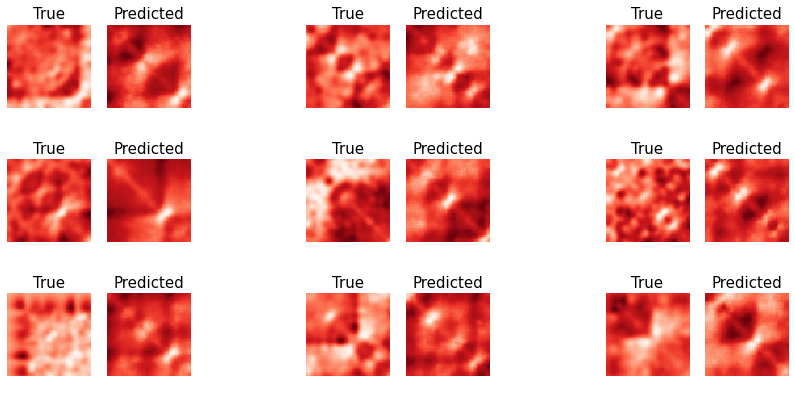

In [ ]:
Model.plot_results()

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_13', 
        model_dir = None, 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])



latent_dim = 16
input_len = 2**14
def enc():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(input_shape=(64, 64, 1),
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(latent_dim, activation='linear')])
    return model

def dec():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(input_shape=(latent_dim, ), units=16*16*32, activation='relu'),
            tf.keras.layers.Reshape(target_shape=(16, 16, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same', activation='sigmoid')])
    return model

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias = False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len))-8
    for block in range(pooling_range):
        #model.add(tf.keras.layers.Dense(64, activation='relu'))
        model.add(tf.keras.layers.Conv1D(64, 5, padding='same')) #new
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

Model.build_enc(enc)
Model.build_dec(dec)
Model.build_model(model)
clear_output()


In [ ]:
from hicpredictor.plot import plot_results
plot_results(Model.ae(data.y_val_sample), data.y_val_sample)

In [ ]:
Model.train(20000, batch_size=64, callbacks='classical')

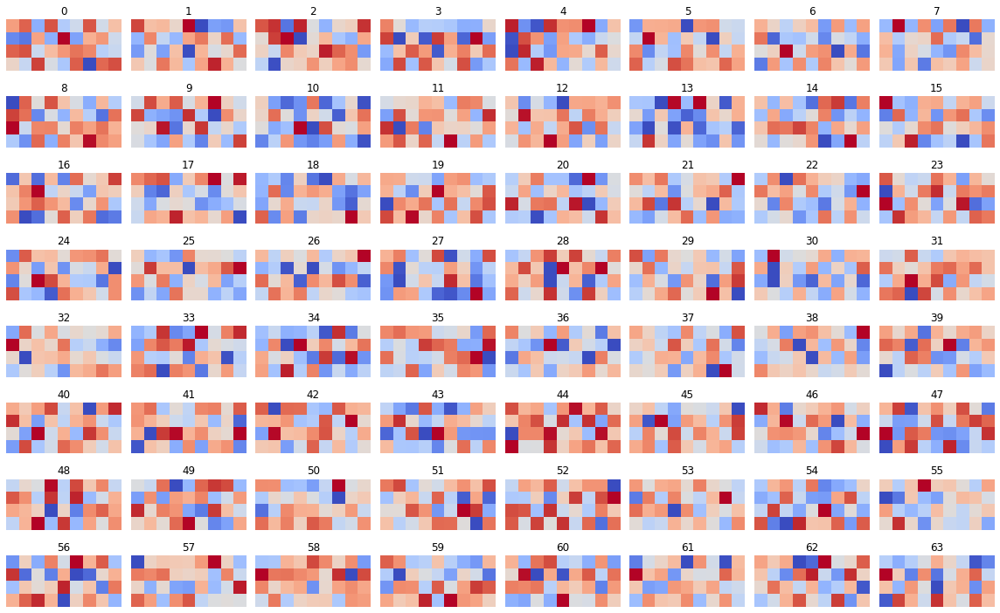

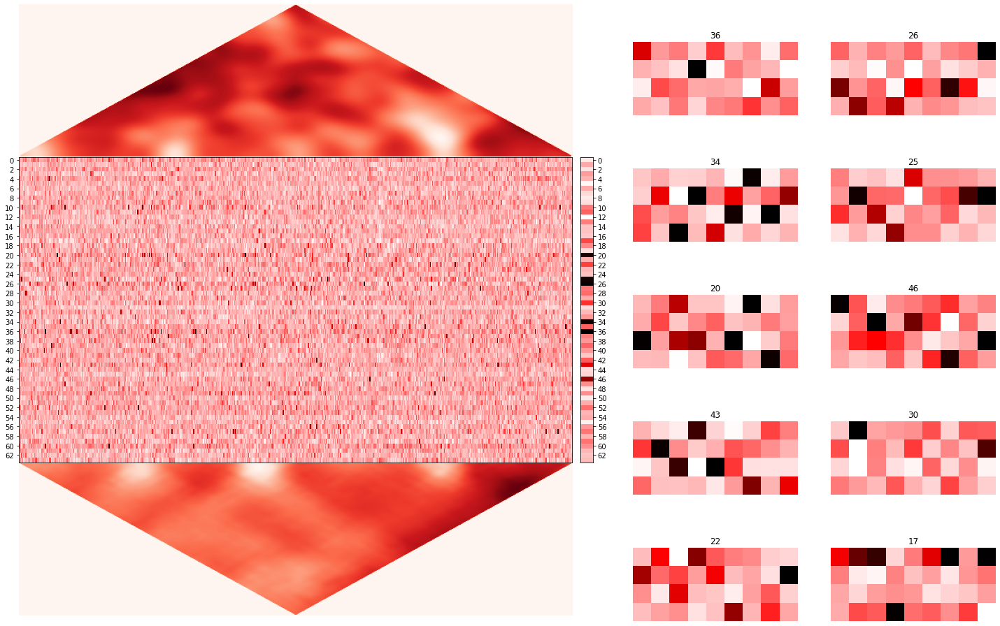

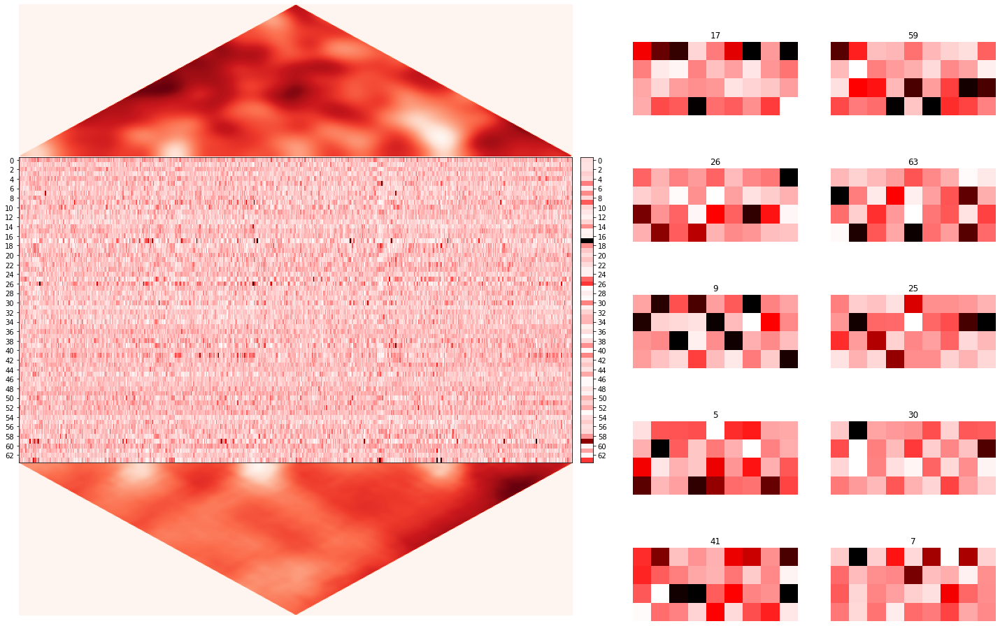

Pearson correlation for training sample (random 128): 0.9392
Pearson correlation for validation sample (whole - 256): 0.4494
Pearson correlations for both samples where X and y are permuted:   0.0529, 0.0012


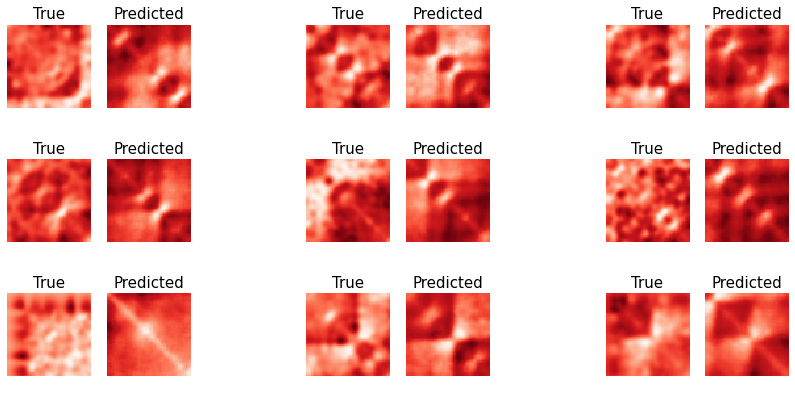

In [ ]:
Model.plot_filters()
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='max', return_filters=False)
Model.graphic_analisis(8, n_layers=3, theme='light', color_shifts={'heatmap': 200, 'filters': 200}, aggregation='mean', return_filters=False)
Model.predict_as_training = False
Model.score()
Model.plot_results()

In [ ]:
from IPython.display import clear_output
clear_output()
import warnings
warnings.filterwarnings('ignore')
folder = "/content/gdrive/My Drive/"

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

import os
import sys
import gc

sys.path.append(folder)
from hicpredictor.dataset import DataMaster
from hicpredictor.training import ModelMaster


folder = "/content/gdrive/My Drive/"
genome = 'sacCer3.fa'
hic_name = 'A364.sacCer3.mapq_30.128.mcool::resolutions/128'
data = DataMaster(
                 hic_file = hic_name, 
                 genome_file_or_dir = genome, 
                 fragment_length = 2**13,
                 sigma = 2,
                 chroms_to_exclude = ['chrIV'],
                 scale = (0,1),
                 map_size = 64,
                 nan_threshold = 0.2,
                 stochastic_sampling = False,
                 expand_dna = True,
                 shift_repeats = 4,
                 rev_comp = False,
                 dna_encoding = 'one-hot',
                 val_split = ('last', 64),
                 cut_chromosome_ends = 0,
                 sample_seed = 0)
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_4', 
        model_dir = folder+'Saccer_4', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])

DNA data for chrI is loaded
DNA data for chrII is loaded
DNA data for chrIII is loaded
DNA data for chrIX is loaded
DNA data for chrM is loaded
DNA data for chrV is loaded
DNA data for chrVI is loaded
DNA data for chrVII is loaded
DNA data for chrVIII is loaded
DNA data for chrX is loaded
DNA data for chrXI is loaded
DNA data for chrXII is loaded
DNA data for chrXIII is loaded
DNA data for chrXIV is loaded
DNA data for chrXV is loaded
DNA data for chrXVI is loaded

For 64x64 map used 4096 + 8192 + 4096 nucleotide fragments
Initial dataset contains 16384x16384 maps, overlooping in 64 pixels
128x128 maps for training will be sampled from them, maps for testing are their top left fragments
Hi-C data for chrI is loaded
Hi-C data for chrII is loaded
Hi-C data for chrIII is loaded
Hi-C data for chrIX is loaded
Hi-C data for chrM is loaded
Hi-C data for chrV is loaded
Hi-C data for chrVI is loaded
Hi-C data for chrVII is loaded
Hi-C data for chrVIII is loaded
Hi-C data for chrX is loaded
Hi-C

In [ ]:
import importlib
import hicpredictor.training as training
importlib.reload(training)
ModelMaster = training.ModelMaster
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_13', 
        model_dir = folder+'Saccer_13', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])
#Model.load_test_chromosome('chrIV')

Hi-C maps successfully encoded


In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
Model.load_test_chromosome('chrIV')

DNA data for chrIV is loaded

For 64x64 map used 4096 + 8192 + 4096 nucleotide fragments
Initial dataset contains 16384x16384 maps, overlooping in 64 pixels
128x128 maps for training will be sampled from them, maps for testing are their top left fragments
Hi-C data for chrIV is loaded


5/5 [==============================] - 2s 375ms/step


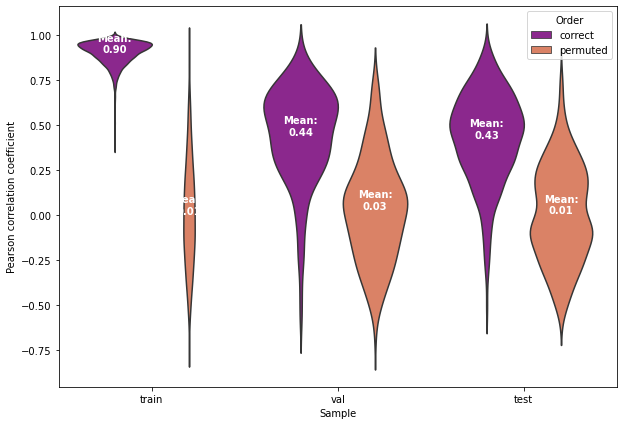

In [ ]:
Model.score()

5/5 [==============================] - 2s 351ms/step


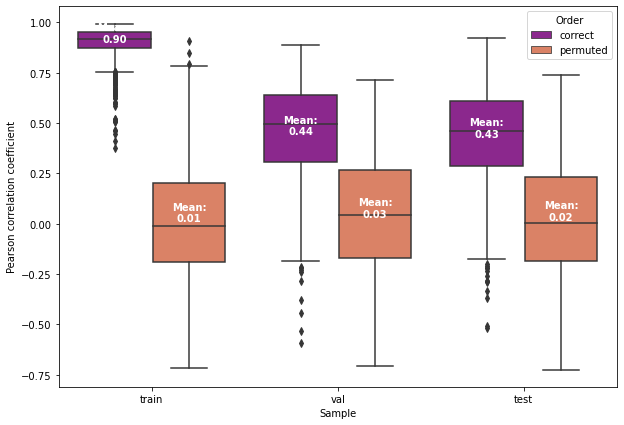

In [ ]:
Model.score(kind='box')

In [ ]:
a = [np.random.normal(10, 1, 300), np.random.normal(4, .5, 300), np.random.normal(15, 1, 300), np.random.normal(8, .5, 300)]
df = pd.DataFrame(columns=['Pearson correlation coefficient',
                         'Sample',
                         'Order'])
for i, values, in enumerate(a):
    order = 'correct' if not i % 2 else 'permuted'
    sample = 'test' if i//2 else 'train'
    data_ = np.array([values, [sample]*len(values), [order]*len(values)]).T
    new_df = pd.DataFrame(data= data_, columns=df.columns)
    df = df.append(new_df, ignore_index=True)
df = df.astype({'Pearson correlation coefficient': float})

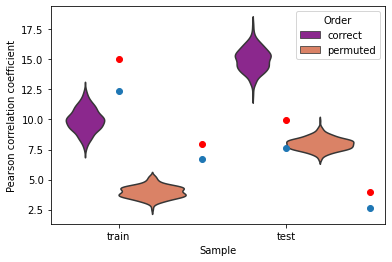

In [ ]:
sns.violinplot(x="Sample", y="Pearson correlation coefficient", hue="Order", data=df, palette="plasma", inner=None)
Means = df.groupby(['Sample', 'Order'])['Pearson correlation coefficient'].mean()
Modes = df.groupby(['Sample', 'Order'])['Pearson correlation coefficient'].agg(lambda x: pd.Series.mode(x)[1])
plt.scatter(x=np.arange(len(Means))/2,y=Means,c="red")
plt.scatter(x=np.arange(len(Modes))/2,y=Modes)

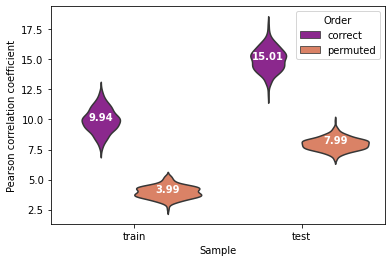

In [ ]:
box_plot = sns.violinplot(x="Sample", y="Pearson correlation coefficient", hue="Order", data=df, palette="plasma", inner=None)
Means = df.groupby(['Sample', 'Order'])['Pearson correlation coefficient'].mean()

for i, xtick in enumerate(box_plot.get_xticklabels()):
    xtick = xtick.get_text()
    box_plot.text(i-0.2, Means[xtick]['correct'], f"{Means[xtick]['correct']:.2f}", horizontalalignment='center',color='w',weight='semibold')
    box_plot.text(i+0.2, Means[xtick]['permuted'], f"{Means[xtick]['permuted']:.2f}", horizontalalignment='center',color='w',weight='semibold')

In [ ]:
Means['test']['correct']

8.019125856136855

In [ ]:
Means

Sample  Order   
test    correct      8.019126
        permuted    14.997964
train   correct      3.978483
        permuted    10.013937
Name: Pearson correlation coefficient, dtype: float64

In [ ]:
xtick.get_text()

'train'

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_4', 
        model_dir = folder+'Saccer_4', 
        rewrite = True,  
        framework = 'tensorflow', 
        model_parts = ['enc', 'dec', 'model'])

Hi-C maps successfully encoded


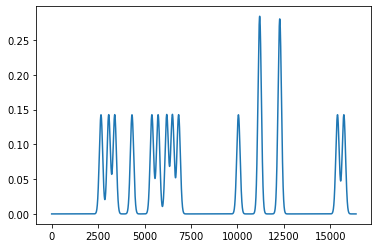

8/8 [==============================] - 1s 15ms/step


In [ ]:
from sklearn.neighbors import KernelDensity
class GaussianMutagenesis(object):
    """docstring for GaussianMutagenesis"""
    def __init__(self, x, y, Model, basic_p = 0.1, n_sample = 256, survive = 16):
        assert x.ndim == 3 and y.ndim == 4
        self.len = x.shape[1]
        self.x = x
        self.y = np.repeat(y, n_sample, axis=0)
        self.n_sample = n_sample
        self.basic_p = basic_p
        self.survive = survive
        self.Model = Model
        self.initialize_p()

    def initialize_p(self):
        def gaussian(mu, sigma):
            return lambda x: np.exp(-1*((x-mu)/sigma)**2)
        mus = np.random.choice(self.len, (16, self.n_sample))
        sigma = self.len / 128
        ls = np.arange(self.len)[None,:]
        ls = np.repeat(ls, self.n_sample, axis=0)
        self.p = np.zeros(ls.shape)
        for mu in mus:
            self.p += gaussian(mu[:,None], sigma)(ls)
        self.p = self.p/self.p.max()*0.5
        gc.collect()
        plt.plot(self.p[10])
        plt.show()


    def mutate(self):
        x = np.repeat(self.x, self.n_sample, axis=0)
        mutations = np.random.random((self.n_sample, self.len)) < self.p
        reps = [[] for _ in range(self.n_sample)]
        for i in range(self.n_sample):
            for j in range(self.len):
                if mutations[i,j]:
                    x[i,j] = np.roll(x[i,j], np.random.choice([1,2,3]))
                    reps[i].append(j)
        #pred = self.Model.predict(x, verbose=1)
        pred = self.Model.dec.predict(self.Model.model.predict(x, verbose=1))
        reward = self.reward(pred, mutations)
        fitness = np.argsort(reward)
        survived_ind = fitness[-self.survive:]
        survived = x[survived_ind]
        self.update_p([reps[i] for i in survived_ind])
        self.x = np.repeat(survived, self.n_sample // self.survive)
        
        gc.collect()
        y_best = pred[fitness[-1]]
        return y_best, reward[fitness[-1]]

    def reward(self, pred, mutations):
        pearson = 1 - np.array(self.Model._pearson(pred, self.y))
        n_mut = mutations.sum(axis=1)
        return pearson / (n_mut+1)
        
    def update_p(self, survived):
        dens = np.zeros(self.len)
        ls = np.linspace(0, self.len, self.len)[...,None]
        for i in survived:
            i=np.array(i)
            kde = KernelDensity(kernel='gaussian', bandwidth=200).fit(i[:,None])
            dens += kde.score_samples(ls)
            gc.collect()
        dens = np.exp(dens)
        self.p = (dens / dens.max() * 0.25)[..., None]
        del dens, ls
        gc.collect()


    def fit(self, epochs):
        for epoch in range(epochs):
            y_best, reward = self.mutate()
            #self.plot_p()
            self.plot_pred(y_best)
            print(epoch+1, reward)
        return self.p

    def plot_p(self):
        plt.figure(figsize=(14,2))
        plt.plot(self.p[:, 0])
        plt.show()

    def plot_pred(self, pred):
        plt.imshow(pred[..., 0], cmap='Reds')
        plt.show()
gm = GaussianMutagenesis(data.x_val[30:31], data.y_val[30:31], Model, basic_p = 0.1, n_sample = 256, survive = 16)
gm.fit(5)

In [ ]:
gm.p.shape

(16384, 1)

In [ ]:
gm.p.shape

(16384, 1)

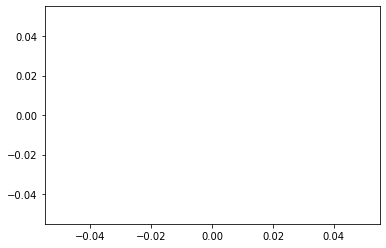

In [ ]:
plt.plot(gm.p[:, 0])

In [ ]:
gm.p

array([[nan],
       [nan],
       [nan],
       ...,
       [nan],
       [nan],
       [nan]])

In [ ]:
data = DataMaster(
                 hic_file = hic_name, 
                 genome_file_or_dir = genome, 
                 fragment_length = 2**13,
                 sigma = 2,
                 chroms_to_exclude = ['chrIV'],
                 scale = (0,1),
                  normalize = 'each',
                 map_size = 64,
                 nan_threshold = 0.2,
                 stochastic_sampling = False,
                 expand_dna = True,
                 shift_repeats = 4,
                 rev_comp = False,
                 dna_encoding = 'one-hot',
                 val_split = ('last', 64),
                 cut_chromosome_ends = 0,
                 sample_seed = 0)
latent_dim = 24
input_len = 2**14
def enc():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(input_shape=(64, 64, 1),
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(latent_dim, activation='linear')])
    return model

def dec():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(input_shape=(latent_dim, ), units=16*16*32, activation='relu'),
            tf.keras.layers.Reshape(target_shape=(16, 16, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same', activation='sigmoid')])
    return model

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 11, padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))

    pooling_range = int(np.log2(input_len)) - 8
    for block in range(pooling_range):
        model.add(tf.keras.layers.Conv1D(64, 5, padding='same', activation='relu'))
        model.add(tf.keras.layers.Dropout(0.1))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

DNA data for chrI is loaded
DNA data for chrII is loaded
DNA data for chrIII is loaded
DNA data for chrIX is loaded
DNA data for chrM is loaded
DNA data for chrV is loaded
DNA data for chrVI is loaded
DNA data for chrVII is loaded
DNA data for chrVIII is loaded
DNA data for chrX is loaded
DNA data for chrXI is loaded
DNA data for chrXII is loaded
DNA data for chrXIII is loaded
DNA data for chrXIV is loaded
DNA data for chrXV is loaded
DNA data for chrXVI is loaded

For 64x64 map used 4096 + 8192 + 4096 nucleotide fragments
Initial dataset contains 128x128 maps, overlooping in 64 pixels
64x64 maps for training will be sampled from them, maps for testing are their top left fragments
Hi-C data for chrI is loaded
Hi-C data for chrII is loaded
Hi-C data for chrIII is loaded
Hi-C data for chrIX is loaded
Hi-C data for chrM is loaded
Hi-C data for chrV is loaded
Hi-C data for chrVI is loaded
Hi-C data for chrVII is loaded
Hi-C data for chrVIII is loaded
Hi-C data for chrX is loaded
Hi-C data 

In [ ]:
Model = ModelMaster(data,
        saving_dir = folder+'Saccer_14',
        rewrite=True)
Model.build(enc, dec, model)
Model.train(1000, callbacks='classical')

In [ ]:
Model.load_test_chromosome('chrIV')

DNA data for chrIV is loaded

For 64x64 map used 4096 + 8192 + 4096 nucleotide fragments
Initial dataset contains 128x128 maps, overlooping in 64 pixels
64x64 maps for training will be sampled from them, maps for testing are their top left fragments
Hi-C data for chrIV is loaded


In [ ]:
Model.train(1000, callbacks='classical')

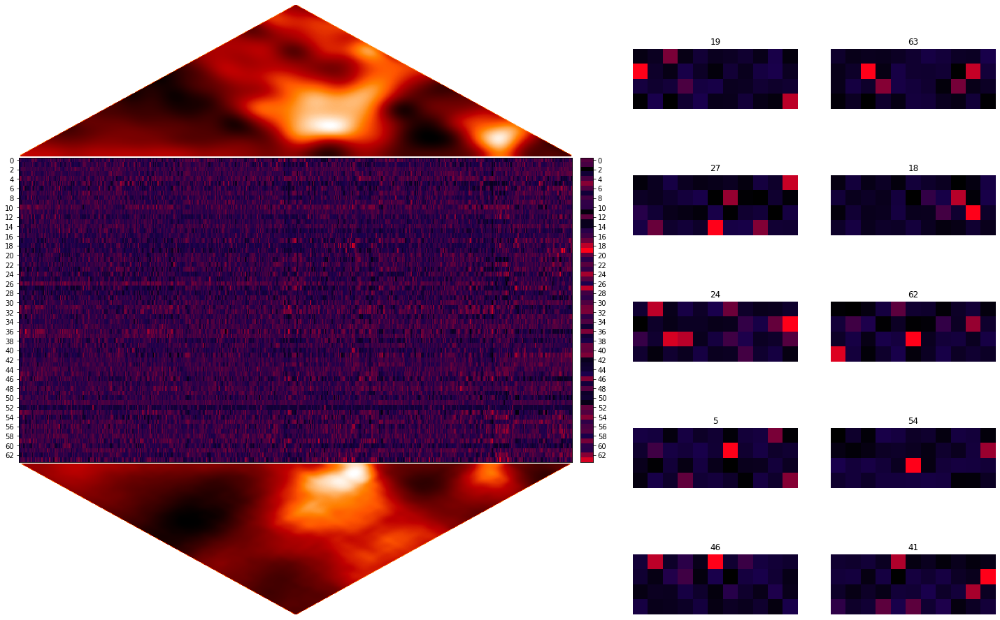

In [ ]:
Model.graphic_analisis(15, aggregation='mean')

In [ ]:
latent_dim = 20
input_len = 2**14
def enc():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(input_shape=(64, 64, 1),
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(latent_dim, activation='linear')])
    return model

def dec():
    model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(input_shape=(latent_dim, ), units=16*16*32, activation='relu'),
            tf.keras.layers.Reshape(target_shape=(16, 16, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same', activation = 'sigmoid')])
    return model

def model(input_len=input_len):

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_len, 4)))

    model.add(tf.keras.layers.Conv1D(64, 9, padding='same', use_bias=False, activation='relu'))
    #model.add(tf.keras.layers.Dropout(0.15)) # new
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))


    pooling_range = int(np.log2(input_len)) - 6
    for block in range(pooling_range):
        model.add(tf.keras.layers.Dense(64, activation='relu'))
        #model.add(tf.keras.layers.Conv1D(64, 3, padding='same', use_bias=False, activation='relu')) #new
        model.add(tf.keras.layers.Dropout(0.1))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.15))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(latent_dim))

    model.compile(loss = 'mse', optimizer = 'nadam')

    return model

Model = ModelMaster(data,
        saving_dir = folder+'Saccer_15',
        rewrite=True)
Model.build(enc, dec, model)
Model.train(1000, callbacks='classical')

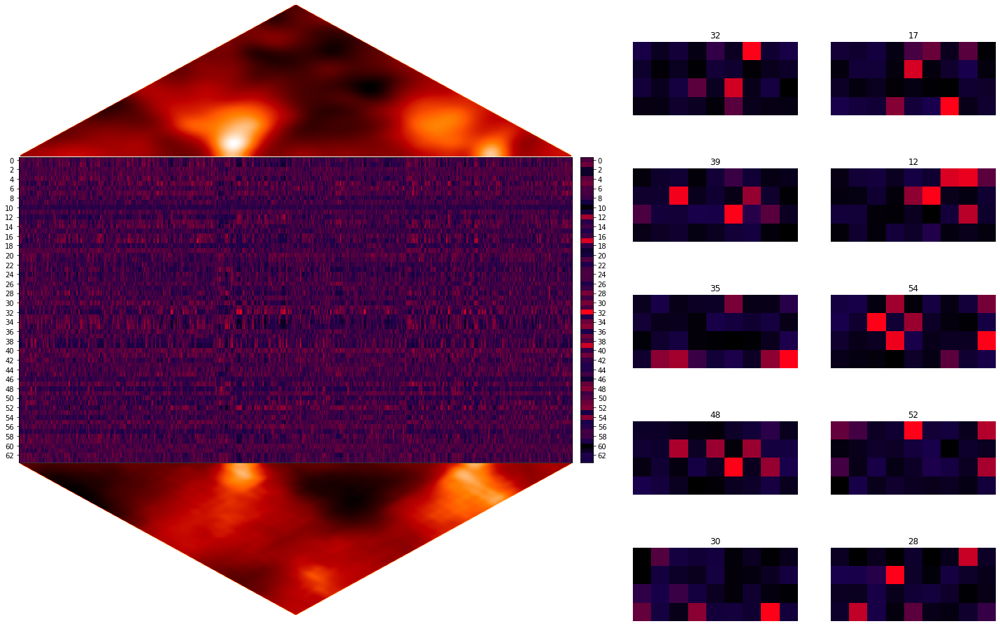

In [ ]:
Model.graphic_analisis(30, aggregation='mean')

In [ ]:
Model.score()

In [ ]:

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
np.random.seed(5)
filter = np.random.normal(0,1,(9,4))

inpt = tf.keras.utils.to_categorical(np.random.choice(4, 9))
np.multiply(filter, inpt).sum()

-2.554235992507495

In [ ]:
from itertools import product
def generate_possible_kmers(n):
    ret = [''.join(x) for x in list(product('ATGC', repeat=n))]
    return ret

seq_length = 524288
repeat_length = 11

seq_all = generate_possible_kmers(repeat_length)

n_observations = seq_length // repeat_length
mod = seq_length %  repeat_length

for iteration in range( 1+(len(seq_all)//n_observations) ):
    
    s_init = 'AGTC' + ''.join( seq_all[iteration*n_observations:(iteration+1)*n_observations] ) + 'A'*mod
    l_trunc = 0
    print(iteration, len(s_init))

    # If we are at the last sequence which is shorter than 524288, fill the rest with polyA:
    if len(s_init)<seq_length+4:
        l_trunc = len(s_init)//repeat_length
        s_init += 'A'*(seq_length+4-len(s_init))
    
    # Running the model, writing activations
    conv2d_layers = [layer for layer in advanced_model.layers if 'Conv1D' in str(layer)][:1]
    layer_outputs = [layer.output for layer in conv2d_layers]
    activation_model = tf.keras.Model(inputs=advanced_model.input, outputs=layer_outputs)

    dna_seq_one_hot = one_hot_dna(s_init)
    dna_seq_one_hot = dna_seq_one_hot[4:seq_length+4, :].reshape(1, seq_length, 4)

    # Reading activations and weights
    activations = activation_model.predict(dna_seq_one_hot) 

    # reading the activations for k-mers, 5 is for account for the shift mode (valid vs same)
    observation_points = [5+i*repeat_length for i in range(n_observations if not l_trunc else l_trunc)]
    output = np.concatenate( [ output, activations[0, observation_points, :] ] )

array([[1., 0., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]], dtype=float32)

In [ ]:
from itertools import product
def generate_possible_kmers(n):
    ret = list(product([0,1,2,3], repeat=n))
    return ret
def encode(seq):
    return tf.keras.utils.to_categorical(seq)
    
a = generate_possible_kmers(9)
b = encode(a)
b.shape

(262144, 9, 4)

In [ ]:
l=[]
for i in b:
    l.append(np.multiply(filter, i).sum())
l = np.array(l)
l = np.argsort(l)

In [ ]:
4**11

4194304

In [ ]:
a[148939]

(2, 1, 0, 1, 1, 3, 0, 2, 3)

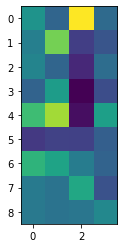

In [ ]:
plt.imshow(filter)

In [ ]:
tf.keras.utils.to_categorical([[0,1,1,0],[2,3,0,1]])

array([[[1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.]],

       [[0., 0., 1., 0.],
        [0., 0., 0., 1.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.]]], dtype=float32)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
folder = "/content/gdrive/My Drive/"


import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

import os
import sys
import gc


Mounted at /content/gdrive


In [ ]:
model = tf.keras.models.load_model(folder+'Saccer_1/model.h5')

In [ ]:
filter = model.layers[0].get_weights()[0].T[33].T

In [ ]:
l=[]
for i in b:
    l.append(np.multiply(np.flip(filter), i).sum())
l = np.array(l)
l = np.argsort(l)

In [ ]:
l[-200:]

array([158457, 158147,  60099, 162497,  76494, 109257,  27201, 142027,
       142021, 142066,  93171, 141761,  10944,  27339, 207571, 224195,
        27333,  27378,  27073,  92893, 223969,  76785,  76515, 223999,
        10953, 207809, 109265, 207613, 240371, 142035, 158659, 125683,
        92785, 256707, 158433,  27347, 158463, 223809,  76355, 109263,
       142273,  76528,  92923,  96963, 207552, 223947,  10961,  92917,
       142077, 174835,  27585,  92657, 223941, 223986,  76487, 223681,
        76537,  76227,  80577, 191171,  27389, 207561, 158273,  10959,
        92878, 142016, 158411,  43761, 158405, 158450, 158145,  60097,
        27328, 223955, 109250, 142025,  93169,  92899,  27337, 207569,
       224193,  76739,  76513, 223997,  76543, 158419,  10946, 207567,
        92739, 240369, 142033, 158657, 125681,  92912, 256705, 223936,
        27345, 158461,  76353, 109261,  92871, 142031,  92921,  92611,
        96961, 223945,  76491, 174833,  27343,  76485,  76530,  76225,
      

In [ ]:
best = [a[i] for i in l[-200:]]

In [ ]:
!pip install gimmemotifs

In [ ]:
from gimmemotifs.motif import motif_from_align

def to_str(arr):
    return ''.join(['ACGT'[i] for i in arr])

m = motif_from_align([to_str(x) for x in best])
m.plot_logo(fname="MotifLogo.png")